# **PREREQUISITES**

In [ ]:
! pip install --pre -U pymoo

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 50.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 249.1/249.1 kB 18.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.7/75.7 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 16.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for grapheme: filename=grapheme-0.6.0-py3-none-any.whl size=210095 sha256=362841b0211a9a6133cda1b6b22bef4eebc6b0088d5aff6cfbd10dcfdfc459a8
  Stored in directory: /root/.cache/pip/wheels/91/a8/bc/5b55a10f763ee2c066ff2d94058d7dd64d570fc45adc027b3d
Successfully built grapheme


In [ ]:
import numpy as np
import math as ma
import scipy
import random
from pymoo.core.problem import Problem
from pymoo.algorithms.moo.nsga3 import NSGA3
from pymoo.algorithms.moo.nsga2 import NSGA2
from pymoo.algorithms.moo.rnsga2 import RNSGA2
from pymoo.algorithms.moo.rnsga3 import RNSGA3
from pymoo.algorithms.moo.moead import MOEAD
from pymoo.factory import get_sampling, get_crossover, get_mutation
from pymoo.core.problem import ElementwiseProblem
from pymoo.factory import get_problem, get_reference_directions
from pymoo.util.ref_dirs import get_reference_directions
from pymoo.optimize import minimize
from pymoo.visualization.scatter import Scatter
from scipy.stats import qmc
from mpl_toolkits import mplot3d
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from pymoo.algorithms.soo.nonconvex.ga import GA
from pymoo.problems import get_problem
from pymoo.optimize import minimize
import matplotlib.pyplot as plt

In [ ]:
H = 50; delta = 0.7; delta1 = 2*delta; x = np.array([0.25, 0.25,0.35,0.45,0.50]);
lb = x - [delta, delta1, delta1, delta1, delta1]
ub = x + [delta, delta1, delta1, delta1, delta1]
sampler = qmc.LatinHypercube(d=5)
sample = sampler.random(n=50)
x_n = qmc.scale(sample, lb, ub)
#x_n

# **TYPE-I ROBUSTNESS**

## **2-Objective Problems**

### **Test Case I**

### NSGA-III for actual solution

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=5,
                         n_obj=2,
                         n_constr=0,
                         xl=np.array([0, -1, -1, -1, -1]),
                         xu=np.array([1, 1, 1, 1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):
        f1 = x[0]
        h = 1-x[0]**2
        g = 40 + x[1]**2 + x[2]**2 + x[3]**2 + x[4]**2 - 10*np.cos(4*ma.pi*x[1]) - 10*np.cos(4*ma.pi*x[2]) - 10*np.cos(4*ma.pi*x[3]) - 10*np.cos(4*ma.pi*x[4])
        S = 1/(0.2 + x[0]) + x[0]**2
        f2 = h + g*S

        out["F"] = [f1, f2]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 2, n_partitions=99)

# create the algorithm object
algorithm = NSGA3(pop_size=100, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=100,
#                  sampling=BinaryRandomSampling(),
#                  crossover=TwoPointCrossover(),
#                 mutation=BitflipMutation(),
#                  eliminate_duplicates=True)
res_act = minimize(problem,
               algorithm,
               ("n_gen", 1000),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |      5 |             - |             -
     2 |      200 |      8 |  0.0043161564 |         nadir
     3 |      300 |      8 |  0.0557913884 |         ideal
     4 |      400 |      7 |  0.0819958105 |         ideal
     5 |      500 |      4 |  0.0091267342 |         nadir
     6 |      600 |      6 |  0.0155733235 |         ideal
     7 |      700 |      4 |  0.0419610560 |         nadir
     8 |      800 |      6 |  0.0455333692 |         ideal
     9 |      900 |      4 |  0.1029916125 |         nadir
    10 |     1000 |      5 |  0.0578555987 |             f
    11 |     1100 |      5 |  0.0387155112 |         nadir
    12 |     1200 |      8 |  0.0231045069 |         ideal
    13 |     1300 |     10 |  0.2757356222 |         nadir
    14 |     1400 |      8 |  0.2080013494 |         nadir
    15 |     1500 |      8 |  0.1143733051 |         nadir
    16 |     1600 |      7 |  0.0187147776 |            

In [ ]:
algorithm_moead = MOEAD(
    ref_dirs,
    n_neighbors=15,
    prob_neighbor_mating=0.7,
)

res_moaed = minimize(problem,
               algorithm_moead,
               ('n_gen', 1000),
               seed=1,
               verbose=False)

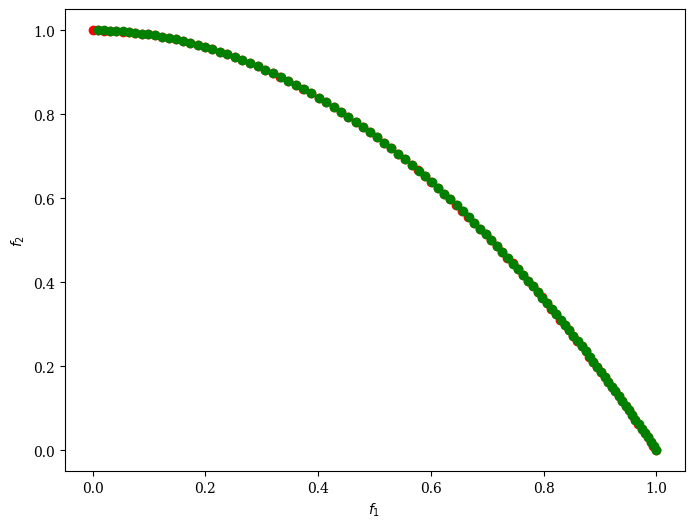

In [ ]:
plot = Scatter()
res_moaed.F = res_moaed.F[res_moaed.F[:,1]<2,:]
plot.add(res_act.F, color="red")
plot.add(res_moaed.F, color="green")
plot.show()

### NSGA III for Robust Solution

In [ ]:
def O2T1_obj1(x):
  return x[:,0]

def O2T1_obj2(x, alpha, beta):
  h = 1-x[:,0]**2
  g = 40 + x[:,1]**2 + x[:,2]**2 + x[:,3]**2 + x[:,4]**2 - 10*np.cos(4*ma.pi*x[:,1]) - 10*np.cos(4*ma.pi*x[:,2]) - 10*np.cos(4*ma.pi*x[:,3]) - 10*np.cos(4*ma.pi*x[:,4])
  S = alpha/(0.2 + x[:,0]) + beta*x[:,0]**2
  return h + g*S

#### $\delta$ = 0.007, 0.008, 0.009, 0.010

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=5,
                         n_obj=2,
                         n_constr=0,
                         xl=np.array([0, -1, -1, -1, -1]),
                         xu=np.array([1, 1, 1, 1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):
        x1 = x[0]; x2 = x[1]; x3 = x[2]; x4 = x[3]; x5 = x[4];
        H = 50; delta = 0.009; delta1 = 2*delta; alpha = 1; beta = 1;
        lb = x - [delta, delta1, delta1, delta1, delta1]
        ub = x + [delta, delta1, delta1, delta1, delta1]
        sampler = qmc.LatinHypercube(d=5)
        sample = sampler.random(n=50)
        xe = qmc.scale(sample, lb, ub)

        f1 = np.mean(O2T1_obj1(xe))
        f2 = np.mean(O2T1_obj2(xe, 1, 1))

        out["F"] = [f1, f2]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 2, n_partitions=99)

# create the algorithm object
algorithm = NSGA3(pop_size=100, ref_dirs=ref_dirs)
# algorithm = NSGA2(pop_size=100)
res2 = minimize(problem,
               algorithm,
               ("n_gen", 1000),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |      6 |             - |             -
     2 |      200 |      7 |  0.0382927822 |             f
     3 |      300 |      9 |  0.0048012688 |         ideal
     4 |      400 |     11 |  0.0554248106 |         ideal
     5 |      500 |      7 |  0.2078998201 |         nadir
     6 |      600 |      4 |  0.0420523767 |             f
     7 |      700 |      6 |  0.0224507243 |         ideal
     8 |      800 |      6 |  0.0025686909 |             f
     9 |      900 |      7 |  0.0579415648 |             f
    10 |     1000 |      5 |  0.0075799628 |         ideal
    11 |     1100 |      4 |  0.6565272226 |         nadir
    12 |     1200 |      5 |  0.0682481952 |         nadir
    13 |     1300 |      5 |  0.4093272356 |         nadir
    14 |     1400 |      8 |  0.0036598424 |         ideal
    15 |     1500 |      8 |  0.0003110946 |             f
    16 |     1600 |      9 |  0.0015286059 |            

In [ ]:
algorithm_moead = MOEAD(
    ref_dirs,
    n_neighbors=15,
    prob_neighbor_mating=0.7,
)

res_moaed1 = minimize(problem,
               algorithm_moead,
               ('n_gen', 1000),
               seed=1,
               verbose=False)

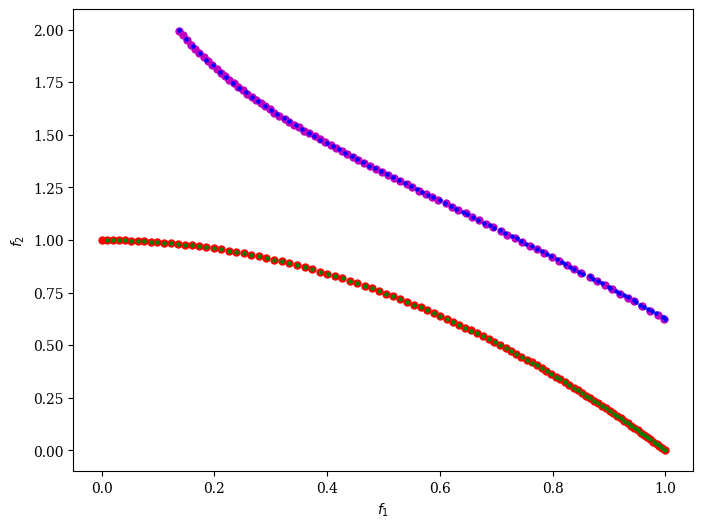

In [ ]:
plot = Scatter()
res_moaed1.F = res_moaed1.F[res_moaed1.F[:,1]<2,:]
res2.F = res2.F[res2.F[:,1]<2,:]
plot.add(res_act.F, s=25, color="red")
plot.add(res_moaed.F, s = 5, color="green")
plot.add(res2.F, s=25, color="m")
plot.add(res_moaed1.F, s=5, color="b")
plot.show()

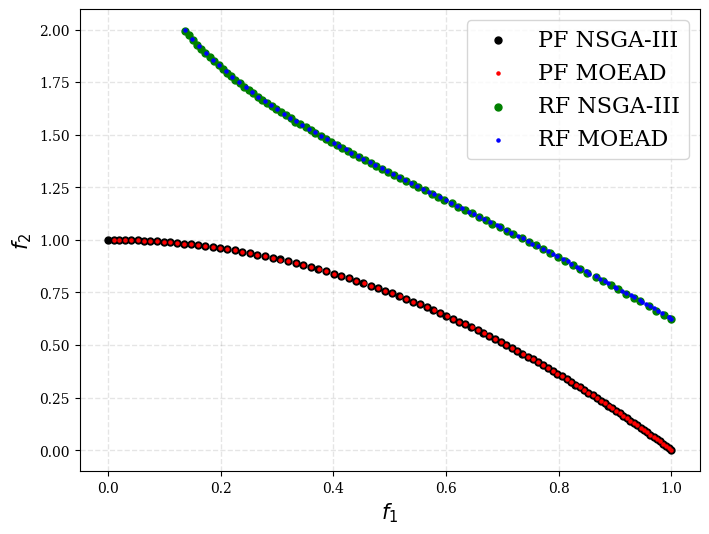

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 6))
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

plt.scatter(res_act.F[:, 0], res_act.F[:, 1], s=25, facecolors='k', edgecolors='k')
plt.scatter(res_moaed.F[:, 0], res_moaed.F[:, 1], s=5, facecolors='r', edgecolors='r')
plt.scatter(res2.F[:, 0], res2.F[:, 1], s=25, facecolors='g', edgecolors='g')
plt.scatter(res_moaed1.F[:, 0], res_moaed1.F[:, 1], s=5, facecolors='b', edgecolors='b')
plt.legend(["PF NSGA-III", "PF MOEAD", "RF NSGA-III", "RF MOEAD"], loc ="upper right",fontsize=16) #"Deterministic",   "beta = 3.5",

plt.xlabel('$f_1$',fontsize=15)
plt.ylabel('$f_2$',fontsize=15)

# plt.title("Robust R-NSGA-III",fontsize=20)
plt.grid(color='k', linestyle='--', linewidth=1, alpha=0.1)
plt.show()

In [ ]:
fa1 = O2T1_obj1(res2.X); fa2 = O2T1_obj2(res2.X,1,1);

In [ ]:
fa = [fa1, fa2]
fa = np.transpose(fa)
#fa

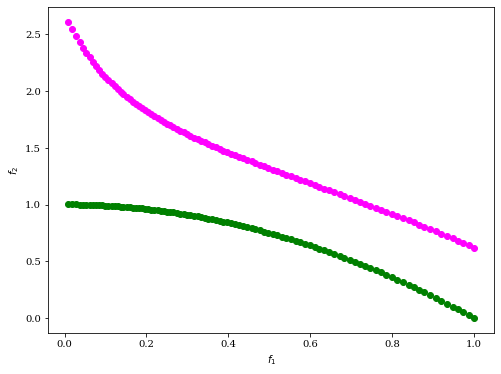

In [ ]:
plot = Scatter()
#res.F = res.F[res.F[:,1]<3]
fa = fa[fa[:,1]<3]
#res1.F = res1.F[res1.F[:,1]<3]
res2.F = res2.F[res2.F[:,1]<4]
#res3.F = res3.F[res3.F[:,1]<4]
#plot.add(rest.F, color="red")
#plot.add(res1.F, color="green")
plot.add(res2.F, color="magenta")
plot.add(fa, color="green")
#plot.add(res3.F, color="blue")
#plot.add(res_act.F, color="black")
plot.show()

### **Test Case II**

### NSGA-III for actual solution

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=5,
                         n_obj=2,
                         n_constr=0,
                         xl=np.array([0, -1, -1, -1, -1]),
                         xu=np.array([1, 1, 1, 1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):
        alpha = 1; beta = 10;
        f1 = x[0]
        h = 1-x[0]**2
        g = 40 + x[1]**2 + x[2]**2 + x[3]**2 + x[4]**2 - 10*np.cos(4*ma.pi*x[1]) - 10*np.cos(4*ma.pi*x[2]) - 10*np.cos(4*ma.pi*x[3]) - 10*np.cos(4*ma.pi*x[4])
        S = alpha/(0.2 + x[0]) + beta*x[0]**2
        f2 = h + g*S

        out["F"] = [f1, f2]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 2, n_partitions=99)

# create the algorithm object
algorithm = NSGA3(pop_size=100, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=100,
#                  sampling=BinaryRandomSampling(),
#                  crossover=TwoPointCrossover(),
#                 mutation=BitflipMutation(),
#                  eliminate_duplicates=True)
res_act = minimize(problem,
               algorithm,
               ("n_gen", 1000),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |      5 |             - |             -
     2 |      200 |      5 |  0.0094730527 |         ideal
     3 |      300 |      4 |  0.0945705333 |         ideal
     4 |      400 |      7 |  0.0888968911 |         ideal
     5 |      500 |      4 |  0.3194628123 |         nadir
     6 |      600 |      6 |  1.0670281578 |         nadir
     7 |      700 |      5 |  0.0140316639 |         ideal
     8 |      800 |      5 |  6.2404479246 |         nadir
     9 |      900 |      5 |  0.0439052118 |         ideal
    10 |     1000 |      5 |  0.0186888116 |             f
    11 |     1100 |      6 |  0.1353821355 |         nadir
    12 |     1200 |      8 |  0.0230545356 |         ideal
    13 |     1300 |      5 |  0.000000E+00 |             f
    14 |     1400 |      6 |  0.0246712356 |             f
    15 |     1500 |      8 |  0.2643673655 |         nadir
    16 |     1600 |      7 |  0.000000E+00 |            

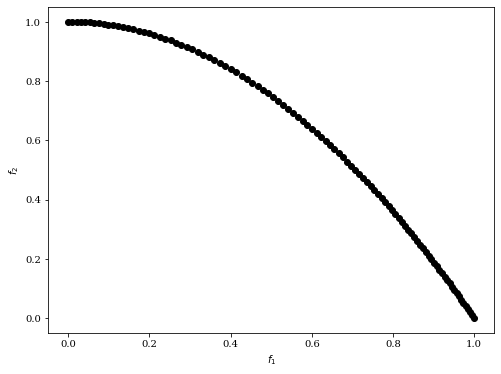

In [ ]:
plot = Scatter()
plot.add(res_act.F, color="black")
plot.show()

### NSGA III for Robust Solution

#### $\delta$ = 0.004, 0.005, 0.006, 0.007

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=5,
                         n_obj=2,
                         n_constr=0,
                         xl=np.array([0, -1, -1, -1, -1]),
                         xu=np.array([1, 1, 1, 1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):
        x1 = x[0]; x2 = x[1]; x3 = x[2]; x4 = x[3]; x5 = x[4];
        H = 50; delta = 0.004; delta1 = 2*delta; alpha = 1; beta = 10;
        lb = x - [delta, delta1, delta1, delta1, delta1]
        ub = x + [delta, delta1, delta1, delta1, delta1]
        sampler = qmc.LatinHypercube(d=5)
        sample = sampler.random(n=50)
        xe = qmc.scale(sample, lb, ub)

        f1 = np.mean(O2T1_obj1(xe))
        f2 = np.mean(O2T1_obj2(xe, 1, 10))

        out["F"] = [f1, f2]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 2, n_partitions=99)

# create the algorithm object
algorithm = NSGA3(pop_size=100, ref_dirs=ref_dirs)
# algorithm = NSGA2(pop_size=100)
res3 = minimize(problem,
               algorithm,
               ("n_gen", 1000),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |      5 |             - |             -
     2 |      200 |      5 |  0.0094753001 |         ideal
     3 |      300 |      8 |  0.0909828344 |         nadir
     4 |      400 |      5 |  0.0650570206 |         nadir
     5 |      500 |      7 |  0.0793880621 |         ideal
     6 |      600 |      4 |  0.0742455913 |         ideal
     7 |      700 |      4 |  0.0046775143 |         ideal
     8 |      800 |      3 |  0.0040299381 |         ideal
     9 |      900 |      7 |  0.0362265417 |         ideal
    10 |     1000 |      4 |  0.0358357102 |         ideal
    11 |     1100 |      5 |  0.5699150625 |         nadir
    12 |     1200 |      5 |  0.9158820327 |         nadir
    13 |     1300 |      4 |  0.000000E+00 |             f
    14 |     1400 |      4 |  0.0143958941 |         nadir
    15 |     1500 |      4 |  3.253101E+01 |         nadir
    16 |     1600 |      4 |  0.9310826595 |         nad

In [ ]:
fb1 = O2T1_obj1(res3.X); fb2 = O2T1_obj2(res3.X,1,10);

In [ ]:
fb1 = O2T1_obj1(res3.X); fb2 = O2T1_obj2(res3.X,1,10);
fb11 = [fb1, fb2]
fb = np.transpose(fb11)

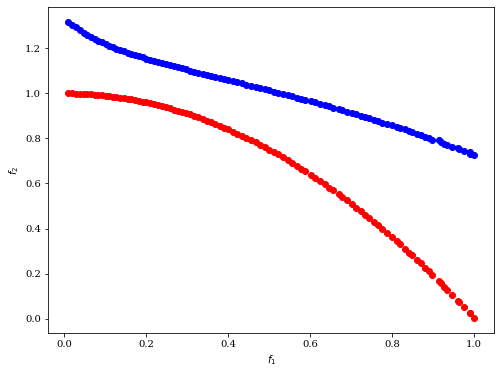

In [ ]:
plot = Scatter()
#res.F = res.F[res.F[:,1]<2]
#res1.F = res1.F[res1.F[:,1]<2]
fb = fb[fb[:,1]<2]
res3.F = res3.F[res3.F[:,1]<2]
plot.add(fb, color="red")
#plot.add(res1.F, color="green")
#plot.add(res2.F, color="magenta")
plot.add(res3.F, color="blue")
#plot.add(res_act.F, color="black")
plot.show()

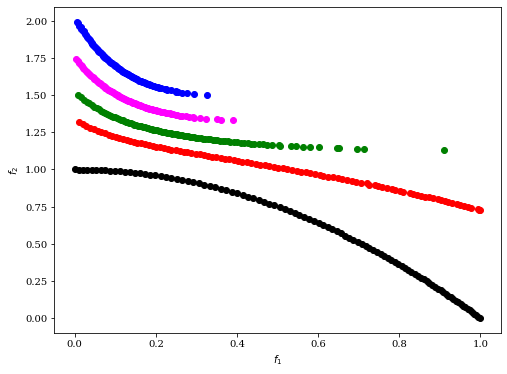

In [ ]:
plot = Scatter()
res.F = res.F[res.F[:,1]<2]
res1.F = res1.F[res1.F[:,1]<2]
res2.F = res2.F[res2.F[:,1]<2]
res3.F = res3.F[res3.F[:,1]<2]
plot.add(res.F, color="red")
plot.add(res1.F, color="green")
plot.add(res2.F, color="magenta")
plot.add(res3.F, color="blue")
plot.add(res_act.F, color="black")
plot.show()

### **Test Case III**

### NSGA-III for actual solution

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=5,
                         n_obj=2,
                         n_constr=0,
                         xl=np.array([0, 0, -1, -1, -1]),
                         xu=np.array([1, 1, 1, 1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):
        f1 = x[0]
        h = 2 - 0.8*ma.exp(-((x[1]-0.35)/0.25)**2) - ma.exp(-((x[1]-0.85)/0.03)**2)
        g = 50*(x[2]**2 + x[3]**2 + x[4]**2)
        S = 1 - x[0]**0.5
        f2 = h*(g + S)

        out["F"] = [f1, f2]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 2, n_partitions=99)

# create the algorithm object
algorithm = NSGA3(pop_size=100, ref_dirs=ref_dirs)
res_act = minimize(problem,
               algorithm,
               ("n_gen", 1000),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |      2 |             - |             -
     2 |      200 |      2 |  0.000000E+00 |             f
     3 |      300 |      4 |  0.0824442730 |         ideal
     4 |      400 |      4 |  0.0369266605 |         ideal
     5 |      500 |      4 |  0.000000E+00 |             f
     6 |      600 |      3 |  0.0061065761 |         ideal
     7 |      700 |      3 |  0.000000E+00 |             f
     8 |      800 |      4 |  0.0468832555 |             f
     9 |      900 |      4 |  4.438100E+01 |         nadir
    10 |     1000 |      5 |  0.0127483542 |         ideal
    11 |     1100 |      4 |  0.3112345945 |         nadir
    12 |     1200 |      5 |  0.0044467170 |         ideal
    13 |     1300 |      6 |  0.0248587107 |             f
    14 |     1400 |      3 |  0.0934922471 |         ideal
    15 |     1500 |      4 |  0.8370262803 |         nadir
    16 |     1600 |      2 |  0.1265109563 |         ide

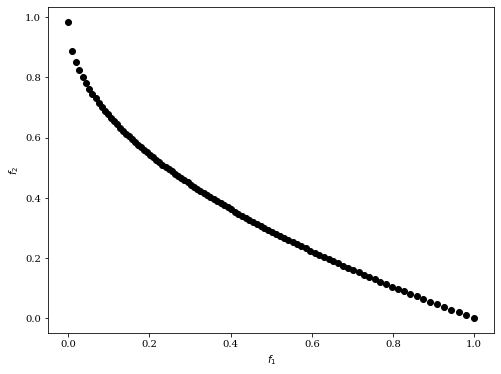

In [ ]:
plot = Scatter()
plot.add(res_act.F, color="black")
plot.show()

### NSGA-III for Robust solution

In [ ]:
def obj1t3(x):
  return x[:,0]

def obj2t3(x):
  h = 2 - 0.8*np.exp(-((x[:,1] - 0.35)/0.25)**2) - np.exp(-((x[:,1] - 0.85)/0.03)**2)
  g = 50*(x[:,2]**2 + x[:,3]**2 + x[:,4]**2)
  S = 1 - (abs(x[:,0])**0.5)
  return h*(g + S)

#### $\delta$ = 0.03

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=5,
                         n_obj=2,
                         n_constr=0,
                         xl=np.array([0, 0, -1, -1, -1]),
                         xu=np.array([1, 1, 1, 1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):
        H = 100; delta = 0.03; delta1 = 2*delta;
        lb = x - [delta, delta, delta1, delta1, delta1]
        ub = x + [delta, delta, delta1, delta1, delta1]
        sampler = qmc.LatinHypercube(d=5)
        sample = sampler.random(n=100)
        xe = qmc.scale(sample, lb, ub)

        f1 = np.mean(obj1t3(xe))
        f2 = np.mean(obj2t3(xe))

        out["F"] = [f1, f2]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 2, n_partitions=99)

# create the algorithm object
algorithm = NSGA3(pop_size=100, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=100)
res = minimize(problem,
               algorithm,
               ("n_gen", 1000),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |      2 |             - |             -
     2 |      200 |      3 |  0.0286460925 |         ideal
     3 |      300 |      4 |  0.0054693930 |         ideal
     4 |      400 |      4 |  0.0195906433 |         ideal
     5 |      500 |      4 |  0.0086156044 |             f
     6 |      600 |      3 |  0.000000E+00 |             f
     7 |      700 |      4 |  0.0278089186 |         ideal
     8 |      800 |      4 |  0.5461860608 |         nadir
     9 |      900 |      4 |  7.1448927689 |         nadir
    10 |     1000 |      3 |  0.0915912434 |         ideal
    11 |     1100 |      4 |  0.6802343627 |         nadir
    12 |     1200 |      5 |  0.0276715171 |         ideal
    13 |     1300 |      4 |  4.5299317222 |         nadir
    14 |     1400 |      5 |  0.0050698219 |         ideal
    15 |     1500 |      8 |  0.0327277393 |         ideal
    16 |     1600 |      8 |  0.0230209327 |            

In [ ]:
fc1 = obj1t3(res.X); fc2 = obj2t3(res.X);
fc11 = [fc1, fc2]
fc = np.transpose(fc11)

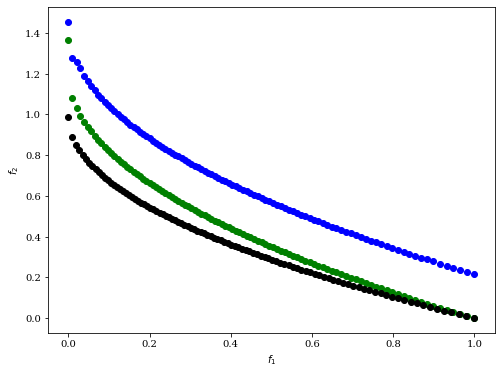

In [ ]:
plot = Scatter()
res.F = res.F[res.F[:,1]<3]
plot.add(res.F, color="blue")
plot.add(fc, color="green")
plot.add(res_act.F, color="black")
plot.show()

### **Test Case IV**

### NSGA-III for actual solution

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=5,
                         n_obj=2,
                         n_constr=0,
                         xl=np.array([0, -0.15, -1, -1, -1]),
                         xu=np.array([1, 1, 1, 1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):
        f1 = x[0]
        h = 2 - 0.8*ma.exp(-((x[0] + x[1]-0.35)/0.25)**2) - ma.exp(-((x[0] + x[1]-0.85)/0.03)**2)
        g = 50*(x[2]**2 + x[3]**2 + x[4]**2)
        S = 1 - x[0]**0.5
        f2 = h*(g + S)

        out["F"] = [f1, f2]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 2, n_partitions=99)

# create the algorithm object
algorithm = NSGA3(pop_size=100, ref_dirs=ref_dirs)
res_act = minimize(problem,
               algorithm,
               ("n_gen", 1000),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |      2 |             - |             -
     2 |      200 |      4 |  0.0399242209 |         nadir
     3 |      300 |      6 |  0.0058427243 |         ideal
     4 |      400 |      7 |  0.0448615978 |         ideal
     5 |      500 |      7 |  0.0875619717 |         nadir
     6 |      600 |      5 |  0.0033588174 |         nadir
     7 |      700 |      6 |  0.0137652549 |         ideal
     8 |      800 |      6 |  0.0205149452 |         ideal
     9 |      900 |      5 |  0.1626766745 |         ideal
    10 |     1000 |      4 |  0.1788133001 |         ideal
    11 |     1100 |      3 |  0.2698441287 |         nadir
    12 |     1200 |      4 |  0.0136528854 |         ideal
    13 |     1300 |      4 |  0.0233222194 |         ideal
    14 |     1400 |      4 |  0.0309903993 |         ideal
    15 |     1500 |      4 |  0.1222688015 |         nadir
    16 |     1600 |      4 |  2.4373247764 |         nad

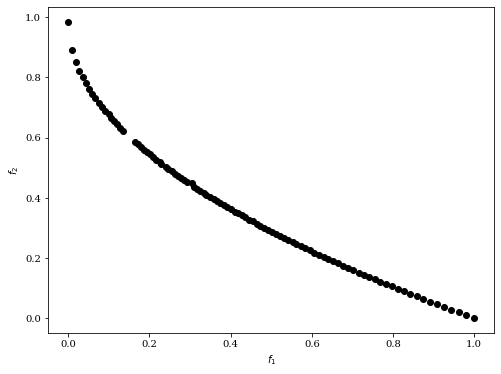

In [ ]:
plot = Scatter()
plot.add(res_act.F, color="black")
plot.show()

### NSGA-III for Robust solution

In [ ]:
def obj1t4(x):
  return x[:,0]

def obj2t4(x):
  h = 2 - 0.8*np.exp(-((x[:,0] + x[:,1] - 0.35)/0.25)**2) - np.exp(-((x[:,0] + x[:,1] - 0.85)/0.03)**2)
  g = 50*(x[:,2]**2 + x[:,3]**2 + x[:,4]**2)
  S = 1 - (abs(x[:,0])**0.5)
  return h*(g + S)

#### **$\delta$ = 0.03**

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=5,
                         n_obj=2,
                         n_constr=0,
                         xl=np.array([0, -0.15, -1, -1, -1]),
                         xu=np.array([1, 1, 1, 1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):
        H = 500; delta = 0.03; delta1 = delta;
        lb = x - [delta, delta, delta1, delta1, delta1]
        ub = x + [delta, delta, delta1, delta1, delta1]
        sampler = qmc.LatinHypercube(d=5)
        sample = sampler.random(n=500)
        xe = qmc.scale(sample, lb, ub)

        f1 = np.mean(obj1t4(xe))
        f2 = np.mean(obj2t4(xe))

        out["F"] = [f1, f2]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 2, n_partitions=199)

# create the algorithm object
algorithm = NSGA3(pop_size=200, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=100)
res = minimize(problem,
               algorithm,
               ("n_gen", 1000),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      200 |      5 |             - |             -
     2 |      400 |      5 |  6.0828247782 |         nadir
     3 |      600 |      8 |  0.0169543517 |         ideal
     4 |      800 |      7 |  0.0082428963 |             f
     5 |     1000 |      6 |  1.9710169548 |         nadir
     6 |     1200 |      7 |  0.2598505390 |         nadir
     7 |     1400 |      4 |  0.4525756464 |         nadir
     8 |     1600 |      5 |  0.3123874823 |         nadir
     9 |     1800 |      4 |  0.0055609452 |         nadir
    10 |     2000 |      5 |  0.0301899969 |         ideal
    11 |     2200 |      7 |  0.0614837855 |             f
    12 |     2400 |      7 |  0.1940095830 |         nadir
    13 |     2600 |      8 |  0.1047518371 |         nadir
    14 |     2800 |     10 |  0.0134945557 |             f
    15 |     3000 |     12 |  0.3963758283 |         nadir
    16 |     3200 |     13 |  0.5539495733 |         nad

In [ ]:
fd1 = obj1t4(res.X); fd2 = obj2t4(res.X);
fd11 = [fd1, fd2]
fd = np.transpose(fd11)

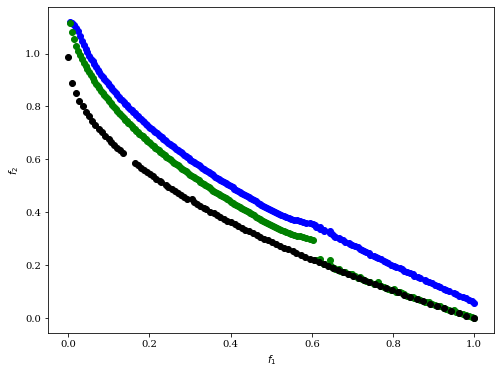

In [ ]:
plot = Scatter()
res.F = res.F[res.F[:,1]<1.5]
fd = fd[fd[:,1]<1.5]
plot.add(res.F, color="blue")
plot.add(fd, color="green")
plot.add(res_act.F, color="black")
plot.show()

## **3-Objective Problem**

### **Test Case I**

### NSGA-III for actual solution

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=5,
                         n_obj=3,
                         n_constr=0,
                         xl=np.array([0, 0, -1, -1, -1]),
                         xu=np.array([1, 1, 1, 1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):
        alpha = 0.75; beta = 10;
        f1 = x[0]
        f2 = x[1]
        h = 2-x[0]**2-x[1]**2
        g = 30 + x[2]**2 + x[3]**2 + x[4]**2 - 10*np.cos(4*ma.pi*x[2]) - 10*np.cos(4*ma.pi*x[3]) - 10*np.cos(4*ma.pi*x[4])
        S = alpha/(0.2 + x[0]) + beta*x[0]**8 + alpha/(0.2 + x[1]) + beta*x[1]**8
        f3 = h + g*S

        out["F"] = [f1, f2, f3]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 3, n_partitions=25)

# create the algorithm object
algorithm = NSGA3(pop_size=400, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=100)
res_act = minimize(problem,
               algorithm,
               ("n_gen", 1000),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      400 |     30 |             - |             -
     2 |      800 |     26 |  0.0078667101 |         ideal
     3 |     1200 |     37 |  0.0093652261 |         ideal
     4 |     1600 |     34 |  0.0110767533 |         ideal
     5 |     2000 |     29 |  0.4473801114 |         nadir
     6 |     2400 |     35 |  0.3809289991 |         nadir
     7 |     2800 |     37 |  0.2758498079 |         nadir
     8 |     3200 |     18 |  2.2488322730 |         nadir
     9 |     3600 |     18 |  0.0142393051 |         ideal
    10 |     4000 |     21 |  0.0199699239 |         nadir
    11 |     4400 |     18 |  0.0150190883 |         ideal
    12 |     4800 |     21 |  0.7741432674 |         nadir
    13 |     5200 |     23 |  0.0073227390 |         ideal
    14 |     5600 |     17 |  2.4194534550 |         nadir
    15 |     6000 |     14 |  0.0091506222 |         ideal
    16 |     6400 |     13 |  0.0585778777 |            

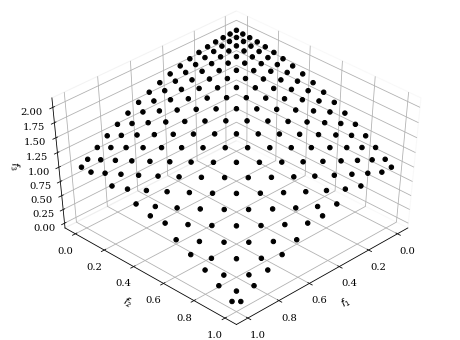

In [ ]:
plot = Scatter()
plot.add(res_act.F, color="black")
plot.show()

### NSGA-III for Robust Solution

In [ ]:
def O3T1_obj1(x):
  return x[:,0]

def O3T1_obj2(x):
  return x[:,1]

def O3T1_obj3(x, alpha, beta):
  h = 2-x[:,0]**2-x[:,1]**2
  g = 30 + x[:,2]**2 + x[:,3]**2 + x[:,4]**2 - 10*np.cos(4*ma.pi*x[:,2]) - 10*np.cos(4*ma.pi*x[:,3]) - 10*np.cos(4*ma.pi*x[:,4])
  S = alpha/(0.2 + x[:,0]) + beta*x[:,0]**8 + alpha/(0.2 + x[:,1]) + beta*x[:,1]**8
  return h + g*S

#### **$\delta$ = 0.01**

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=5,
                         n_obj=3,
                         n_constr=0,
                         xl=np.array([0, 0, -1, -1, -1]),
                         xu=np.array([1, 1, 1, 1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):
        x1 = x[0]; x2 = x[1]; x3 = x[2]; x4 = x[3]; x5 = x[4];
        H = 50; delta = 0.01; delta1 = 2*delta; alpha = 1; beta = 1;
        lb = x - [delta, delta, delta1, delta1, delta1]
        ub = x + [delta, delta, delta1, delta1, delta1]
        sampler = qmc.LatinHypercube(d=5)
        sample = sampler.random(n=50)
        xe = qmc.scale(sample, lb, ub)

        f1 = np.mean(O3T1_obj1(xe))
        f2 = np.mean(O3T1_obj2(xe))
        f3 = np.mean(O3T1_obj3(xe, 0.75, 10))

        out["F"] = [f1, f2, f3]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 3, n_partitions=25)

# create the algorithm object
algorithm = NSGA3(pop_size=400, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=100)
res = minimize(problem,
               algorithm,
               ("n_gen", 500),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      400 |     30 |             - |             -
     2 |      800 |     26 |  0.0100759582 |         ideal
     3 |     1200 |     35 |  0.0099545858 |         ideal
     4 |     1600 |     50 |  0.0057430650 |         ideal
     5 |     2000 |     36 |  0.7247753743 |         nadir
     6 |     2400 |     38 |  0.0033340619 |         ideal
     7 |     2800 |     28 |  0.0085087705 |         ideal
     8 |     3200 |     27 |  0.3571718227 |         nadir
     9 |     3600 |     35 |  0.3728683558 |         nadir
    10 |     4000 |     28 |  0.0054269067 |         nadir
    11 |     4400 |     25 |  0.0063132012 |         ideal
    12 |     4800 |     28 |  0.1119798805 |         nadir
    13 |     5200 |     24 |  1.3190351954 |         nadir
    14 |     5600 |     23 |  0.6542748314 |         nadir
    15 |     6000 |     22 |  1.394087E+01 |         nadir
    16 |     6400 |     21 |  0.0544079959 |            

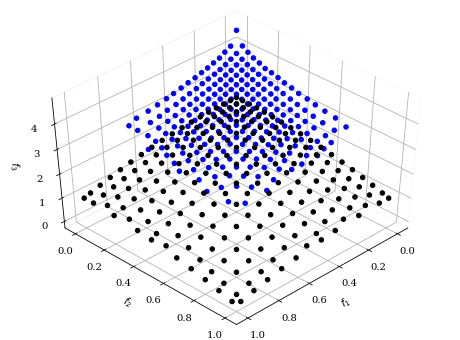

In [ ]:
plot = Scatter()
res.F = res.F[res.F[:,2]<5]
plot.add(res_act.F, color="black")
plot.add(res.F, color="blue")
plot.show()

### **Test Case II**

### NSGA-III for actual solution

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=5,
                         n_obj=3,
                         n_constr=0,
                         xl=np.array([0, 0, 0, -1, -1]),
                         xu=np.array([1, 1, 1, 1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):
        f1 = x[0]
        f2 = x[1]
        h = 2 - 0.8*ma.exp(-((x[2] -0.35)/0.25)**2) - ma.exp(-((x[2] -0.85)/0.03)**2)
        g =  20 + x[3]**2 + x[4]**2 - 10*np.cos(4*ma.pi*x[3]) - 10*np.cos(4*ma.pi*x[4])
        S = 10 - x[0]**0.5- x[1]**0.5
        f3 = h*(g + S)

        out["F"] = [f1, f2, f3]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 3, n_partitions=25)

# create the algorithm object
algorithm = NSGA3(pop_size=400, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=100)
res_act = minimize(problem,
               algorithm,
               ("n_gen", 500),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      400 |     38 |             - |             -
     2 |      800 |     28 |  0.0067545392 |         ideal
     3 |     1200 |     26 |  0.3131122500 |         nadir
     4 |     1600 |     23 |  0.3788039104 |         nadir
     5 |     2000 |     33 |  0.2844935898 |         nadir
     6 |     2400 |     31 |  0.1895148858 |         nadir
     7 |     2800 |     24 |  5.4315847881 |         nadir
     8 |     3200 |     36 |  0.0143813177 |         ideal
     9 |     3600 |     27 |  0.0269376543 |         ideal
    10 |     4000 |     16 |  0.0187015744 |         ideal
    11 |     4400 |     11 |  1.690385E+01 |         nadir
    12 |     4800 |     14 |  2.2141163128 |         nadir
    13 |     5200 |     14 |  0.8891328259 |         nadir
    14 |     5600 |     13 |  2.1683398474 |         nadir
    15 |     6000 |     12 |  0.0228230587 |         ideal
    16 |     6400 |     15 |  1.5311787305 |         nad

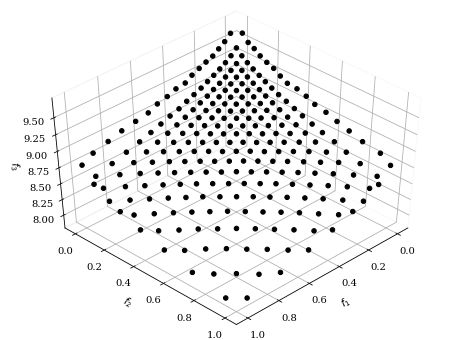

In [ ]:
plot = Scatter()
res_act.F = res_act.F[res_act.F[:,2]<20]
plot.add(res_act.F, color="black")
plot.show()

### NSGA-III for Robust solution

In [ ]:
def O3T2_obj1(x):
  return x[:,0]

def O3T2_obj2(x):
  return x[:,1]

def O3T2_obj3(x):
  h = 2 - 0.8*np.exp(-((x[:,2] -0.35)/0.25)**2) - np.exp(-((x[:,2] -0.85)/0.03)**2)
  g = 20 + x[:,3]**2 + x[:,4]**2 - 10*np.cos(4*ma.pi*x[:,3]) - 10*np.cos(4*ma.pi*x[:,4])
  S = 10 - np.max(x[:,0],0)**0.5- np.max(x[:,1],0)**0.5
  return h*(g + S)

#### **$\delta$ = 0.03**

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=5,
                         n_obj=3,
                         n_constr=0,
                         xl=np.array([0, 0, 0, -1, -1]),
                         xu=np.array([1, 1, 1, 1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):
        x1 = x[0]; x2 = x[1]; x3 = x[2]; x4 = x[3]; x5 = x[4];
        H = 50; delta = 0.05; delta1 = 2*delta;
        lb = x - [delta, delta, delta, delta1, delta1]
        ub = x + [delta, delta, delta, delta1, delta1]
        sampler = qmc.LatinHypercube(d=5)
        sample = sampler.random(n=50)
        xe = qmc.scale(sample, lb, ub)

        f1 = np.mean(O3T2_obj1(xe))
        f2 = np.mean(O3T2_obj2(xe))
        f3 = np.mean(O3T2_obj3(xe))

        out["F"] = [f1, f2, f3]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 3, n_partitions=25)

# create the algorithm object
algorithm = NSGA3(pop_size=400, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=100)
res = minimize(problem,
               algorithm,
               ("n_gen", 500),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      400 |     34 |             - |             -
     2 |      800 |     34 |  0.0784161175 |             f
     3 |     1200 |     38 |  0.1564945828 |         nadir
     4 |     1600 |     18 |  0.0028548516 |         nadir
     5 |     2000 |     22 |  0.0082573528 |         ideal
     6 |     2400 |     28 |  0.0099997411 |         ideal
     7 |     2800 |     34 |  0.0044853870 |         ideal
     8 |     3200 |     29 |  0.0759384830 |         nadir
     9 |     3600 |     29 |  4.2151659161 |         nadir
    10 |     4000 |     38 |  0.0054330015 |         ideal
    11 |     4400 |     44 |  0.3015654486 |         nadir
    12 |     4800 |     40 |  0.5282517333 |         nadir
    13 |     5200 |     49 |  0.5797856932 |         nadir
    14 |     5600 |     52 |  0.0070116753 |         ideal
    15 |     6000 |     62 |  0.0282892489 |         nadir
    16 |     6400 |     62 |  0.0052959364 |         nad

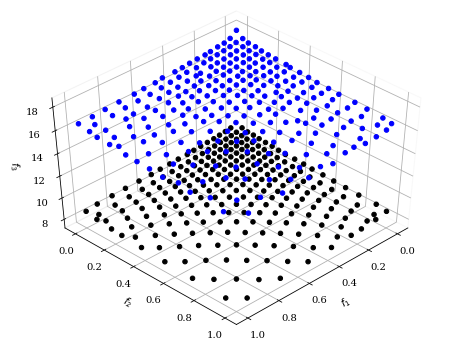

In [ ]:
plot = Scatter()
res_act.F = res_act.F[res_act.F[:,2]<20]
res.F = res.F[res.F[:,2]<20]
plot.add(res_act.F, color="black")
plot.add(res.F, color="blue")
plot.show()

## **4-Objective Problem**

### **NSGA-III for actual solution**

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=5,
                         n_obj=4,
                         n_constr=0,
                         xl=np.array([0, 0, 0, -1, -1]),
                         xu=np.array([1, 1, 1, 1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):
        alpha = 0.75; beta = 10;
        f1 = x[0]
        f2 = x[1]
        f3 = x[2]
        h = 3 - x[0]**2 - x[1]**2 - x[2]**2
        g = 20 + x[3]**2 + x[4]**2 - 10*np.cos(4*ma.pi*x[3]) - 10*np.cos(4*ma.pi*x[4])
        S = alpha/(0.2 + x[0]) + beta*x[0]**8 + alpha/(0.2 + x[1]) + beta*x[1]**8 + alpha/(0.2 + x[2]) + beta*x[2]**8
        f4 = h + g*S

        out["F"] = [f1, f2, f3, f4]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 4, n_partitions=10)

# create the algorithm object
algorithm = NSGA3(pop_size=900, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=100)
res_act = minimize(problem,
               algorithm,
               ("n_gen", 200),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      900 |     28 |             - |             -
     2 |     1800 |     50 |  0.0030168614 |         ideal
     3 |     2700 |     30 |  0.0056140040 |         ideal
     4 |     3600 |     39 |  0.0145393802 |         ideal
     5 |     4500 |     67 |  0.7316852438 |         nadir
     6 |     5400 |     47 |  0.0078543755 |         ideal
     7 |     6300 |     37 |  0.0033097307 |         ideal
     8 |     7200 |     45 |  0.2544492812 |         nadir
     9 |     8100 |     52 |  0.3031999526 |         nadir
    10 |     9000 |     54 |  5.2939284195 |         nadir
    11 |     9900 |     65 |  0.0150290762 |         ideal
    12 |    10800 |     70 |  2.0395795682 |         nadir
    13 |    11700 |     37 |  7.8733950704 |         nadir
    14 |    12600 |     34 |  4.7435839629 |         nadir
    15 |    13500 |     25 |  0.0207939204 |         ideal
    16 |    14400 |     26 |  0.0056619060 |         ide

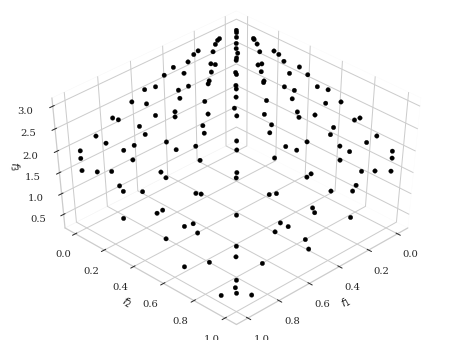

In [ ]:
plot = Scatter()
res_act.F = res_act.F[res_act.F[:,3]<3.5]
plot.add(res_act.F[:,[1,2,3]], color="black")
plot.show()

### **NSGA-III for Robust solution**

In [ ]:
def O4T1_obj1(x):
  return x[:,0]

def O4T1_obj2(x):
  return x[:,1]

def O4T1_obj3(x):
  return x[:,2]

def O4T1_obj4(x, alpha, beta):
  h = 3 - x[:,0]**2 - x[:,1]**2 - x[:,2]**2
  g = 20 + x[:,3]**2 + x[:,4]**2 - 10*np.cos(4*ma.pi*x[:,3]) - 10*np.cos(4*ma.pi*x[:,4])
  S = alpha/(0.2 + x[:,0]) + beta*x[:,0]**8 + alpha/(0.2 + x[:,1]) + beta*x[:,1]**8 + alpha/(0.2 + x[:,2]) + beta*x[:,2]**8
  return h + g*S

#### **$\delta$ = 0.005, 0.01, 0.02; $H$ = [2,5,50]**

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=5,
                         n_obj=4,
                         n_constr=0,
                         xl=np.array([0, 0, 0, -1, -1]),
                         xu=np.array([1, 1, 1, 1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):
        x1 = x[0]; x2 = x[1]; x3 = x[2]; x4 = x[3]; x5 = x[4];
        H = 5; delta = 0.01; delta1 = 2*delta; alpha = 1; beta = 1;
        lb = x - [delta, delta, delta, delta1, delta1]
        ub = x + [delta, delta, delta, delta1, delta1]
        sampler = qmc.LatinHypercube(d=5)
        sample = sampler.random(n=H)
        xe = qmc.scale(sample, lb, ub)

        f1 = np.mean(O4T1_obj1(xe))
        f2 = np.mean(O4T1_obj2(xe))
        f3 = np.mean(O4T1_obj3(xe))
        f4 = np.mean(O4T1_obj4(xe, 0.75, 10))

        out["F"] = [f1, f2, f3, f4]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 4, n_partitions=10)

# create the algorithm object
algorithm = NSGA3(pop_size=900, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=100)
res1 = minimize(problem,
               algorithm,
               ("n_gen", 200),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      900 |     30 |             - |             -
     2 |     1800 |     51 |  0.0031201846 |         ideal
     3 |     2700 |     67 |  0.0035573336 |         ideal
     4 |     3600 |     85 |  0.0083396954 |         ideal
     5 |     4500 |     77 |  0.4371756617 |         nadir
     6 |     5400 |     86 |  0.0058708180 |         ideal
     7 |     6300 |     63 |  0.0027289078 |         ideal
     8 |     7200 |     62 |  0.1794518162 |         nadir
     9 |     8100 |     71 |  0.4371994531 |         nadir
    10 |     9000 |     66 |  0.0048409636 |         ideal
    11 |     9900 |     70 |  0.3481047745 |         nadir
    12 |    10800 |     41 |  2.7300396366 |         nadir
    13 |    11700 |     49 |  0.0046678513 |         ideal
    14 |    12600 |     47 |  0.8385632901 |         nadir
    15 |    13500 |     43 |  0.0121076368 |             f
    16 |    14400 |     50 |  0.0045143411 |         ide

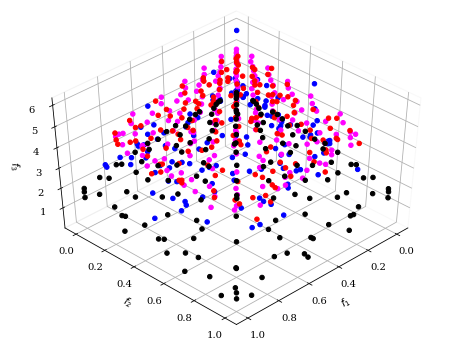

In [ ]:
plot = Scatter()
res.F = res.F[res.F[:,3]<6]
res1.F = res1.F[res1.F[:,3]<6]
res2.F = res2.F[res2.F[:,3]<50]
plot.add(res_act.F[:,[1,2,3]], color="black")
plot.add(res.F[:,[1,2,3]], color="blue")
plot.add(res1.F[:,[1,2,3]], color="red")
plot.add(res2.F[:,[1,2,3]], color="magenta")
plot.show()

In [ ]:
import pandas as pd
import numpy as np
from google.colab import files
#res.X = res.X[np.where(res.F[:,3]<5)]
res1.X = res1.X[np.where(res1.F[:,3]<6)]
res2.X = res2.X[np.where(res2.F[:,3]<15)]
res_act.X = res_act.X[np.where(res_act.F[:,3]<3.5)]

T1_Obj4 = pd.DataFrame(np.concatenate((res1.F,res1.X),axis=1))

T1_Obj4.to_csv("T1_Obj4.csv")
files.download("T1_Obj4.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### **PCP Plots of the Robust Pareto optimal front**

In [ ]:
from google.colab import files
uploaded = files.upload()


Saving 4Obj_Delta.xlsx to 4Obj_Delta.xlsx


In [ ]:
import io
import pandas as pd
df = pd.read_excel(io.BytesIO(uploaded['4Obj_eta.xlsx']))
df.head()
df1 = df

In [ ]:
from sklearn.preprocessing import MinMaxScaler
import plotly.express as px
# data=data.sort_values(by=['x3'])
# scaler = MinMaxScaler()
# df=scaler.fit_transform(data.values)
# df=pd.DataFrame(df)

df.rename(columns = {0:'x1',1:'x2',2:'x3',3:'x4'}, inplace = True)
fig = px.parallel_coordinates(df,color='Category',
                              dimensions=['F1','F2','F3','F4','Category'], color_continuous_scale=["black", "yellow", "red", "lightseagreen"],
                              color_continuous_midpoint=np.mean(df['Category']))
fig.update_layout(
    font_color="black",
    title_font_family="Times New Roman",
    title_font_color="red",
    legend_title_font_color="green",
    font=dict(
        family="Times New Roman",
        size=24,
        color="black")
)


# plt.plot(n_evals2, opt2, "-.",label="With modified design bounds",lw=3.5)
# plt.plot(n_evals1, opt1, "",label="With given design bounds",lw=3.5)
# plt.legend(fontsize=24)
#fig.show()

In [ ]:
from sklearn.preprocessing import MinMaxScaler
import plotly.express as px
# data=data.sort_values(by=['x3'])
# scaler = MinMaxScaler()
# df=scaler.fit_transform(data.values)
# df=pd.DataFrame(df)

fig = px.parallel_coordinates(df,color='Category',
                              dimensions=['X1','X2','X3','X4','X5','Category'], color_continuous_scale=["gray","red","blue","green"],
                              color_continuous_midpoint=np.mean(df['Category']))
fig.update_layout(
    font_color="black",
    title_font_family="Times New Roman",
    title_font_color="red",
    legend_title_font_color="green",
    font=dict(
        family="Times New Roman",
        size=22,
        color="black")
)

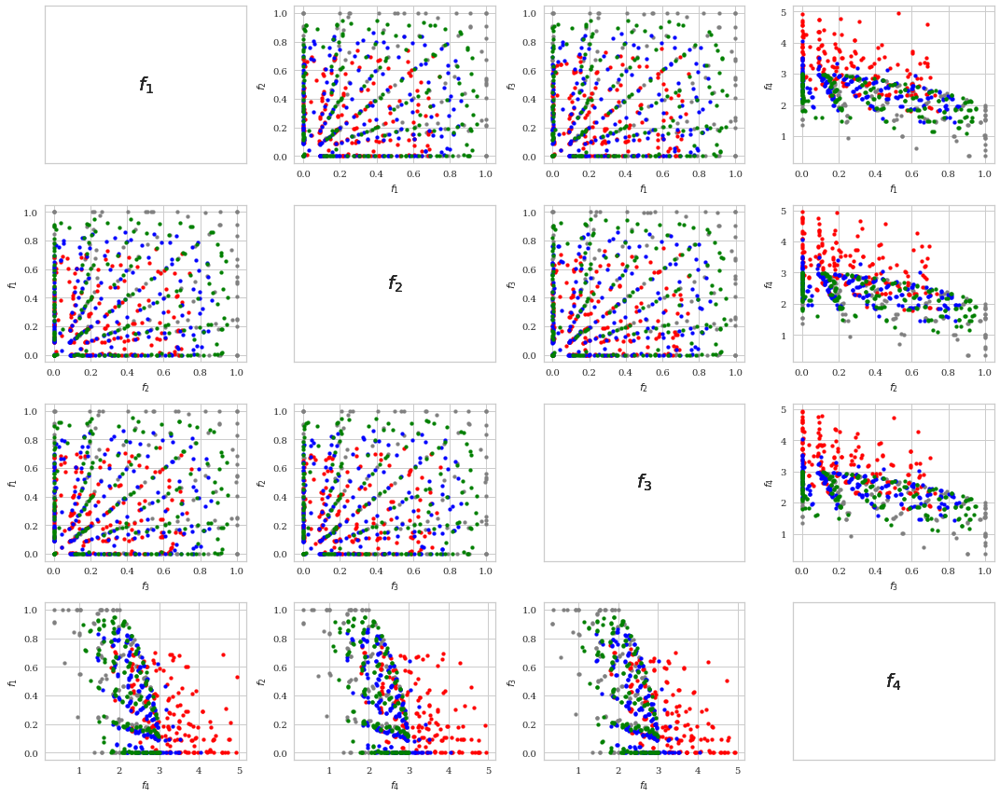

In [ ]:
plot = Scatter(tight_layout=True,figsize=(15, 12))
A1 = np.array(df.values.tolist())
plot.add(A1[np.where(A1[:,9]==0),0:4], s=15, color="gray")
plot.add(A1[np.where(A1[:,9]==0.4),0:4], s=15, color="red")
plot.add(A1[np.where(A1[:,9]==0.6),0:4], s=15, color="blue")
plot.add(A1[np.where(A1[:,9]==1.0),0:4], s=15, color="green")

plot.show()

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving 4Obj_eta.xlsx to 4Obj_eta (1).xlsx


In [ ]:
import io
import pandas as pd
df = pd.read_excel(io.BytesIO(uploaded['4Obj_eta.xlsx']))
df.head()


,F1,F2,F3,F4,X1,X2,X3,X4,X5,Category
0,0.848130,0.000283,0.633719,1.879486,0.848130,0.000283,0.633719,-0.000243,5.599818e-05,0.0
1,0.460407,0.000837,0.152966,2.764738,0.460407,0.000837,0.152966,0.000115,8.330946e-05,0.0
2,0.580947,0.581440,0.000085,2.324441,0.580947,0.581440,0.000085,-0.000001,5.220194e-05,0.0
3,0.999510,0.999555,0.665696,0.559718,0.999510,0.999555,0.665696,0.000114,2.082350e-04,0.0
4,0.999987,0.910140,0.903277,0.356228,0.999987,0.910140,0.903277,0.000167,-8.001267e-07,0.0


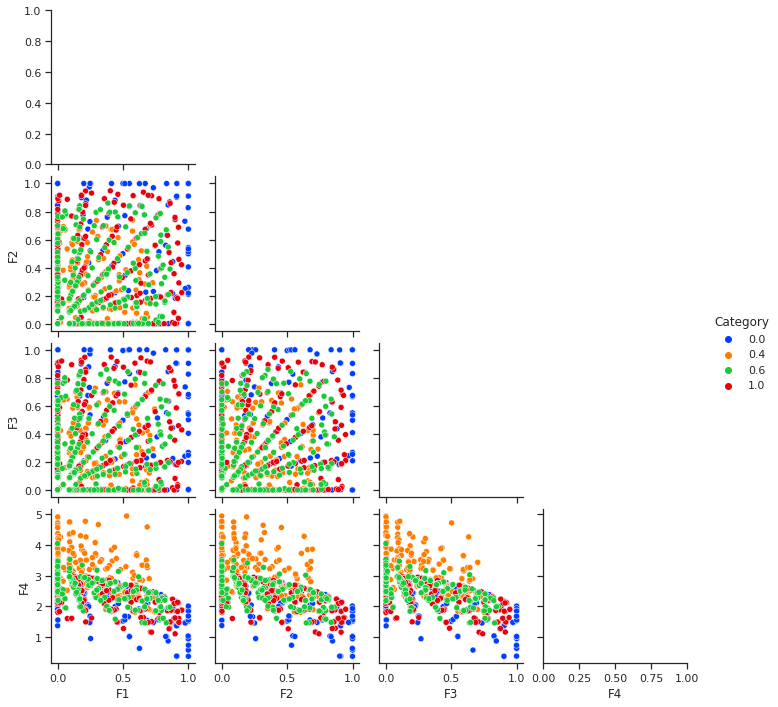

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="ticks")
df1 = df[['F1','F2','F3','F4','Category']]
sns.pairplot(df1, diag_kind = "None", hue="Category", palette="bright", corner=True)
sns.set(rc={'figure.figsize':(30,10)})

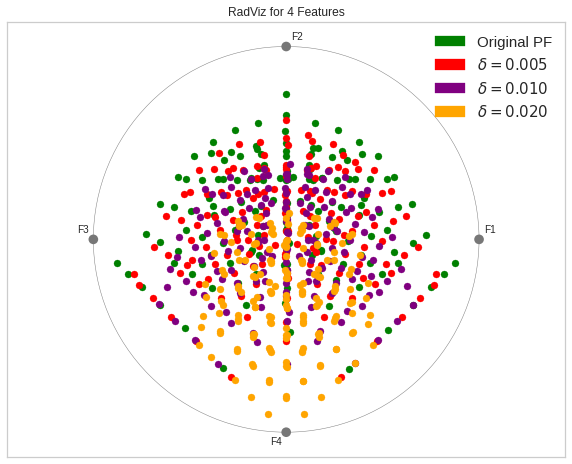

In [ ]:
from yellowbrick.features import RadViz
import matplotlib.pyplot as plt
import matplotlib
from yellowbrick.style.palettes import PALETTES, SEQUENCES, color_palette

# Load the classification dataset
X = df[['F1','F2','F3','F4']]
y = df['Category']

classes = ["Original PF","$\delta = 0.005$", "$\delta = 0.010$", "$\delta = 0.020$"]

# Instantiate the visualizer
fig, axes = plt.subplots(figsize=(10,8))
visualizer = RadViz(classes=classes, colors = {'purple','orange','green','red'}, alpha = 1.0)

visualizer.fit(X, y)           # Fit the data to the visualizer
visualizer.transform(X)        # Transform the data

matplotlib.rc('font', size=14)
matplotlib.rc('legend', fontsize=15)
visualizer.show()              # Finalize and render the figure

In [ ]:
from google.colab import files
uploaded = files.upload()
import io
import pandas as pd
df = pd.read_excel(io.BytesIO(uploaded['4Obj_Delta.xlsx']))
df.head()

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving 4Obj_H.xlsx to 4Obj_H (3).xlsx


In [ ]:
import io
import pandas as pd
df = pd.read_excel(io.BytesIO(uploaded['4Obj_H.xlsx']))
df.head()

,F1,F2,F3,F4,X1,X2,X3,X4,X5,Category
0,0.848130,0.000283,0.633719,1.879486,0.848130,0.000283,0.633719,-0.000243,5.599818e-05,0.0
1,0.460407,0.000837,0.152966,2.764738,0.460407,0.000837,0.152966,0.000115,8.330946e-05,0.0
2,0.580947,0.581440,0.000085,2.324441,0.580947,0.581440,0.000085,-0.000001,5.220194e-05,0.0
3,0.999510,0.999555,0.665696,0.559718,0.999510,0.999555,0.665696,0.000114,2.082350e-04,0.0
4,0.999987,0.910140,0.903277,0.356228,0.999987,0.910140,0.903277,0.000167,-8.001267e-07,0.0


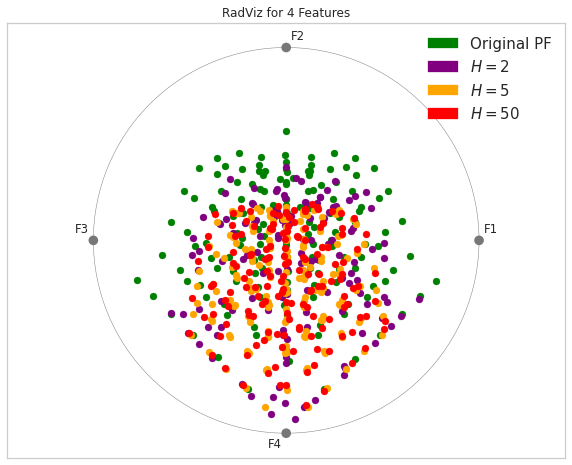

In [ ]:
from yellowbrick.features import RadViz
import matplotlib.pyplot as plt
import matplotlib
from yellowbrick.style.palettes import PALETTES, SEQUENCES, color_palette

# Load the classification dataset
X = df[['F1','F2','F3','F4']]
y = df['Category']

classes = ["Original PF","$H = 2$", "$H = 5$", "$H = 50$"]

# Instantiate the visualizer
fig, axes = plt.subplots(figsize=(10,8))
visualizer = RadViz(classes=classes, colors = {'purple','orange','green','red'}, alpha = 1.0)

visualizer.fit(X, y)           # Fit the data to the visualizer
visualizer.transform(X)        # Transform the data

matplotlib.rc('font', size=14)
matplotlib.rc('legend', fontsize=15)
visualizer.show()              # Finalize and render the figure

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving 4Obj_eta.xlsx to 4Obj_eta (2).xlsx


In [ ]:
import io
import pandas as pd
df = pd.read_excel(io.BytesIO(uploaded['4Obj_eta.xlsx']))
df.head()

,F1,F2,F3,F4,X1,X2,X3,X4,X5,Category
0,0.848130,0.000283,0.633719,1.879486,0.848130,0.000283,0.633719,-0.000243,5.599818e-05,0.0
1,0.460407,0.000837,0.152966,2.764738,0.460407,0.000837,0.152966,0.000115,8.330946e-05,0.0
2,0.580947,0.581440,0.000085,2.324441,0.580947,0.581440,0.000085,-0.000001,5.220194e-05,0.0
3,0.999510,0.999555,0.665696,0.559718,0.999510,0.999555,0.665696,0.000114,2.082350e-04,0.0
4,0.999987,0.910140,0.903277,0.356228,0.999987,0.910140,0.903277,0.000167,-8.001267e-07,0.0


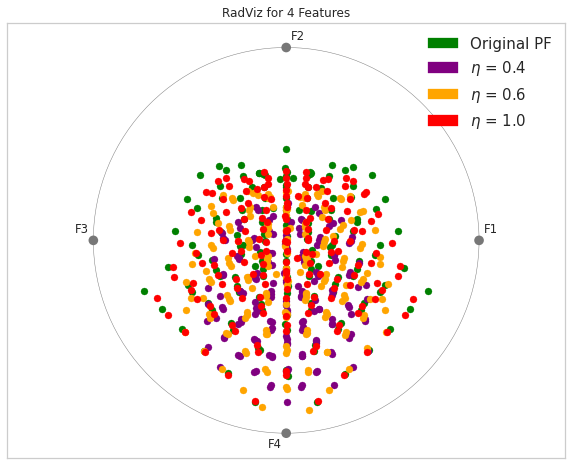

In [ ]:
from yellowbrick.features import RadViz
import matplotlib.pyplot as plt
import matplotlib
from yellowbrick.style.palettes import PALETTES, SEQUENCES, color_palette

# Load the classification dataset
X = df[['F1','F2','F3','F4']]
y = df['Category']

classes = ["Original PF","$\eta$ = 0.4", "$\eta$ = 0.6", "$\eta$ = 1.0"]

# Instantiate the visualizer
fig, axes = plt.subplots(figsize=(10,8))
visualizer = RadViz(classes=classes, colors = {'purple','orange','green','red'}, alpha = 1.0)

visualizer.fit(X, y)           # Fit the data to the visualizer
visualizer.transform(X)        # Transform the data

matplotlib.rc('font', size=14)
matplotlib.rc('legend', fontsize=15)
visualizer.show()              # Finalize and render the figure

## **8-Objective Problem**

### **NSGA III for Actual Solution**

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=10,
                         n_obj=8,
                         n_constr=0,
                         xl=np.array([0, 0, 0, 0, 0, 0, 0, 0, -1, -1]),
                         xu=np.array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):
        f1 = x[0]
        f2 = x[1]
        f3 = x[2]
        f4 = x[3]
        f5 = x[4]
        f6 = x[5]
        f7 = x[6]
        h = 2 - 0.8*ma.exp(-((x[7] -0.35)/0.25)**2) - ma.exp(-((x[7] -0.85)/0.03)**2)
        g =  20 + x[8]**2 + x[9]**2 - 10*np.cos(4*ma.pi*x[8]) - 10*np.cos(4*ma.pi*x[9])
        S = 10 - x[0]**0.5 - x[1]**0.5 - x[2]**0.5 - x[3]**0.5 - x[4]**0.5 - x[5]**0.5 - x[6]**0.5
        f8 = h*(g + S)

        out["F"] = [f1, f2, f3, f4, f5, f6, f7, f8]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 8, n_partitions=6)

algorithm = NSGA3(pop_size=1750, ref_dirs=ref_dirs)
# algorithm = NSGA2(pop_size=200)
res_act = minimize(problem,
               algorithm,
               ("n_gen", 200),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |     1750 |    219 |             - |             -
     2 |     3500 |    274 |  0.0046918880 |         ideal
     3 |     5250 |    294 |  0.0219240383 |         ideal
     4 |     7000 |    332 |  0.0119011530 |         ideal
     5 |     8750 |    421 |  0.0073008623 |         ideal
     6 |    10500 |    310 |  0.0095529790 |         ideal
     7 |    12250 |    279 |  0.0273120935 |         ideal
     8 |    14000 |    204 |  0.0313558257 |         ideal
     9 |    15750 |    242 |  0.0113403513 |         ideal
    10 |    17500 |    281 |  0.0137209221 |         ideal
    11 |    19250 |    300 |  0.1073402634 |         nadir
    12 |    21000 |    376 |  0.0781002861 |         nadir
    13 |    22750 |    397 |  0.2855323444 |         nadir
    14 |    24500 |    443 |  0.0121300077 |         ideal
    15 |    26250 |    442 |  0.0098842201 |         ideal
    16 |    28000 |    426 |  0.0097707329 |         ide

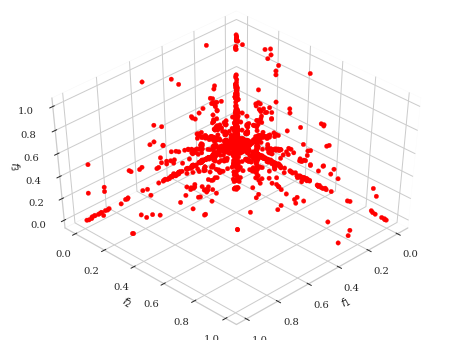

In [ ]:
plot = Scatter()
# res_act.F = res_act.F[res_act.F[:,3]<3.5]
plot.add(res_act.F[:,[0,1,4]], color="red")
plot.show()

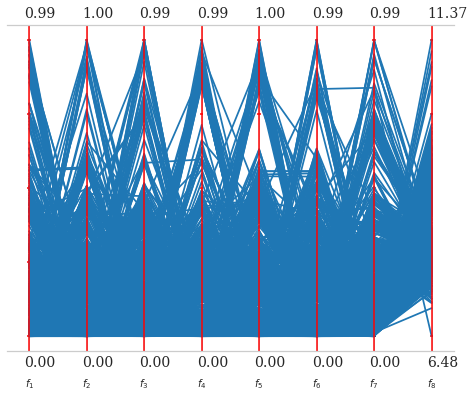

In [ ]:
from pymoo.visualization.pcp import PCP
res_act.F = res_act.F[np.where(res_act.F[:,7]<20)]
PCP().add(res_act.F).show()

In [ ]:
import pandas as pd
import numpy as np
from google.colab import files
res_act.X = res_act.X[np.where(res_act.F[:,7]<20)]
Obj8 = pd.DataFrame(np.concatenate((res_act.F,res_act.X),axis=1))
Obj8.to_csv("Obj8.csv")
files.download("Obj8.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### **NSGA III for Robust Solution**

In [ ]:
def O8T1_obj1(x):
  return x[:,0]

def O8T1_obj2(x):
  return x[:,1]

def O8T1_obj3(x):
  return x[:,2]

def O8T1_obj4(x):
  return x[:,3]

def O8T1_obj5(x):
  return x[:,4]

def O8T1_obj6(x):
  return x[:,5]

def O8T1_obj7(x):
  return x[:,6]

def O8T1_obj8(x):
  h = 2 - 0.8*np.exp(-((x[:,7] -0.35)/0.25)**2) - np.exp(-((x[:,7] -0.85)/0.03)**2)
  g = 20 + x[:,8]**2 + x[:,9]**2 - 10*np.cos(4*ma.pi*x[:,8]) - 10*np.cos(4*ma.pi*x[:,9])
  S = 10 - np.max(x[:,0],0)**0.5 - np.max(x[:,1],0)**0.5 - np.max(x[:,2],0)**0.5 - np.max(x[:,3],0)**0.5 - np.max(x[:,4],0)**0.5 - np.max(x[:,5],0)**0.5 - np.max(x[:,6],0)**0.5
  return h*(g + S)


#### **$\delta$ = 0.050, 0.075, 0.100**

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=10,
                         n_obj=8,
                         n_constr=0,
                         xl=np.array([0, 0, 0, 0, 0, 0, 0, 0, -1, -1]),
                         xu=np.array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):

        delta = 0.05; delta1 = 2*delta;
        lb = x - [delta, delta, delta, delta, delta, delta, delta, delta1, delta1, delta1]
        ub = x + [delta, delta, delta, delta, delta, delta, delta, delta1, delta1, delta1]
        sampler = qmc.LatinHypercube(d=10)
        sample = sampler.random(n=5)
        xe = qmc.scale(sample, lb, ub)

        f1 = np.mean(O8T1_obj1(xe))
        f2 = np.mean(O8T1_obj2(xe))
        f3 = np.mean(O8T1_obj3(xe))
        f4 = np.mean(O8T1_obj4(xe))
        f5 = np.mean(O8T1_obj5(xe))
        f6 = np.mean(O8T1_obj6(xe))
        f7 = np.mean(O8T1_obj7(xe))
        f8 = np.mean(O8T1_obj8(xe))

        out["F"] = [f1, f2, f3, f4, f5, f6, f7, f8]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 8, n_partitions=6)

algorithm = NSGA3(pop_size=1750, ref_dirs=ref_dirs)
# algorithm = NSGA2(pop_size=200)
res4 = minimize(problem,
               algorithm,
               ("n_gen", 100),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |     1750 |    226 |             - |             -
     2 |     3500 |    281 |  0.0056265590 |         ideal
     3 |     5250 |    371 |  0.0251377261 |         ideal
     4 |     7000 |    150 |  0.0366096620 |         ideal
     5 |     8750 |    233 |  0.0045829030 |         ideal
     6 |    10500 |    286 |  0.0440422864 |         ideal
     7 |    12250 |    228 |  0.0458197375 |         ideal
     8 |    14000 |    327 |  0.0101418888 |         ideal
     9 |    15750 |    360 |  0.4415166943 |         nadir
    10 |    17500 |    385 |  0.0210859637 |         ideal
    11 |    19250 |    397 |  0.1230442315 |         nadir
    12 |    21000 |    393 |  0.0064076890 |         ideal
    13 |    22750 |    319 |  0.0079104688 |         ideal
    14 |    24500 |    324 |  0.0311495032 |         ideal
    15 |    26250 |    382 |  0.1524605988 |         nadir
    16 |    28000 |    432 |  0.2327857745 |         nad

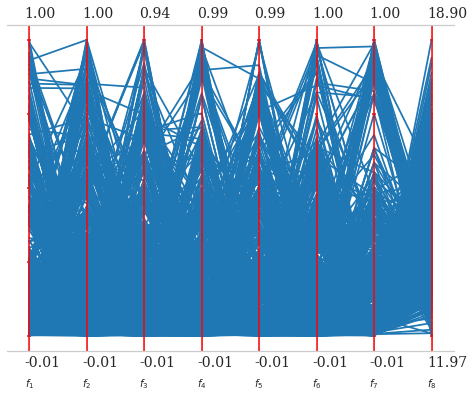

In [ ]:
from pymoo.visualization.pcp import PCP
res4.F = res4.F[np.where(res4.F[:,7]<24)]
PCP().add(res4.F).show()

In [ ]:
import pandas as pd
import numpy as np
from google.colab import files
res4.X = res4.X[np.where(res4.F[:,7]<24)]
Obj8_H5 = pd.DataFrame(np.concatenate((res4.F,res4.X),axis=1))
Obj8_H5.to_csv("Obj8_H5.csv")
files.download("Obj8_H5.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## **Hyper Volume Calculation**

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Obj8_H10.csv to Obj8_H10 (1).csv


In [ ]:
import io
import pandas as pd
df = pd.read_csv(io.BytesIO(uploaded['Obj8_H10.csv']))
df.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,0,0.008448,0.000954,0.341960,0.018166,0.699244,0.010568,0.002781,14.906910,0.007605,0.001141,0.341074,0.018367,0.699943,0.010718,0.002765,0.374189,-0.006193,0.002870
1,1,0.140072,0.006015,0.015621,0.005508,0.144530,0.168685,0.306657,15.041390,0.140249,0.006237,0.015605,0.005186,0.144380,0.167401,0.304433,0.354965,0.002249,-0.020263
2,2,0.653046,0.021232,0.010655,0.234787,0.004776,0.388803,0.002231,14.418070,0.654403,0.020869,0.010414,0.235661,0.005265,0.389361,0.002542,0.332016,-0.001580,-0.008135
3,3,0.010296,0.001931,0.005692,0.010238,0.002796,0.333371,0.066431,15.436455,0.009974,0.002416,0.004945,0.008683,0.002629,0.333650,0.066113,0.353852,0.008172,0.001650
4,4,0.293840,0.015603,0.428254,0.208053,0.287273,0.003014,0.246362,13.556779,0.294664,0.015605,0.427799,0.208540,0.285263,0.000805,0.245948,0.366980,-0.000371,0.006949


In [ ]:
A = np.array(df[['0','1','2','3','4','5','6','7']].values.tolist())

In [ ]:
len(A[:,0])

1450

In [ ]:
from pymoo.indicators.hv import HV
ref_point = np.array([1.1,1.1,1.1,1.1,1.1,1.1,1.1,35.0])

ind = HV(ref_point=ref_point)
print("HV", ind(A[101:150,:]))

HV 40.64160675038488


## **Plots for 8-Objective problem**

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving T2_Obj8_Del.xlsx to T2_Obj8_Del.xlsx


In [ ]:
import io
import pandas as pd
import numpy as np
df = pd.read_excel(io.BytesIO(uploaded['T2_Obj8_Del.xlsx']))
df.head()

,F1,F2,F3,F4,F5,F6,F7,F8,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,Category
0,0.134552,0.560692,0.000691,0.113936,0.002255,0.005673,0.002865,8.227098,0.134552,0.560692,0.000691,0.113936,0.002255,0.005673,0.002865,0.850416,0.000066,0.001865,0.0
1,0.067263,0.064866,0.004494,0.000504,0.003897,0.199121,0.063812,8.560637,0.067263,0.064866,0.004494,0.000504,0.003897,0.199121,0.063812,0.851845,-0.002162,-0.003917,0.0
2,0.109312,0.001813,0.002298,0.257365,0.266308,0.000208,0.004456,8.399420,0.109312,0.001813,0.002298,0.257365,0.266308,0.000208,0.004456,0.851179,0.001022,-0.006511,0.0
3,0.012889,0.044381,0.333339,0.012349,0.005378,0.331744,0.126304,7.924869,0.012889,0.044381,0.333339,0.012349,0.005378,0.331744,0.126304,0.850617,0.008292,-0.001210,0.0
4,0.051925,0.115917,0.003163,0.073664,0.007361,0.000904,0.104814,8.571506,0.051925,0.115917,0.003163,0.073664,0.007361,0.000904,0.104814,0.850219,-0.002996,-0.005797,0.0


In [ ]:
from sklearn.preprocessing import MinMaxScaler
import plotly.express as px
# data=data.sort_values(by=['x3'])
# scaler = MinMaxScaler()
# df=scaler.fit_transform(data.values)
# df=pd.DataFrame(df)

fig = px.parallel_coordinates(df,color='Category',
                              dimensions=['F1','F2','F3','F4','F5','F6','F7','F8','Category'], color_continuous_scale=["gray","red","blue","green"],
                              color_continuous_midpoint=np.mean(df['Category']))
fig.update_layout(
    font_color="black",
    title_font_family="Times New Roman",
    title_font_color="red",
    legend_title_font_color="green",
    font=dict(
        family="Times New Roman",
        size=22,
        color="black")
)

In [ ]:
from sklearn.preprocessing import MinMaxScaler
import plotly.express as px
# data=data.sort_values(by=['x3'])
# scaler = MinMaxScaler()
# df=scaler.fit_transform(data.values)
# df=pd.DataFrame(df)

fig = px.parallel_coordinates(df,color='Category',
                              dimensions=['F1','F2','F3','F4','F5','F6','F7','F8','Category'], color_continuous_scale=["gray","red","blue","green"],
                              color_continuous_midpoint=np.mean(df['Category']))
fig.update_layout(
    font_color="black",
    title_font_family="Times New Roman",
    title_font_color="red",
    legend_title_font_color="green",
    font=dict(
        family="Times New Roman",
        size=22,
        color="black")
)


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving T2_Obj8_Del.xlsx to T2_Obj8_Del (2).xlsx


In [ ]:
import io
import pandas as pd
df = pd.read_excel(io.BytesIO(uploaded['T2_Obj8_Del.xlsx']))
df.head()

,F1,F2,F3,F4,F5,F6,F7,F8,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,Category
0,0.134552,0.560692,0.000691,0.113936,0.002255,0.005673,0.002865,8.227098,0.134552,0.560692,0.000691,0.113936,0.002255,0.005673,0.002865,0.850416,0.000066,0.001865,0.0
1,0.067263,0.064866,0.004494,0.000504,0.003897,0.199121,0.063812,8.560637,0.067263,0.064866,0.004494,0.000504,0.003897,0.199121,0.063812,0.851845,-0.002162,-0.003917,0.0
2,0.109312,0.001813,0.002298,0.257365,0.266308,0.000208,0.004456,8.399420,0.109312,0.001813,0.002298,0.257365,0.266308,0.000208,0.004456,0.851179,0.001022,-0.006511,0.0
3,0.012889,0.044381,0.333339,0.012349,0.005378,0.331744,0.126304,7.924869,0.012889,0.044381,0.333339,0.012349,0.005378,0.331744,0.126304,0.850617,0.008292,-0.001210,0.0
4,0.051925,0.115917,0.003163,0.073664,0.007361,0.000904,0.104814,8.571506,0.051925,0.115917,0.003163,0.073664,0.007361,0.000904,0.104814,0.850219,-0.002996,-0.005797,0.0


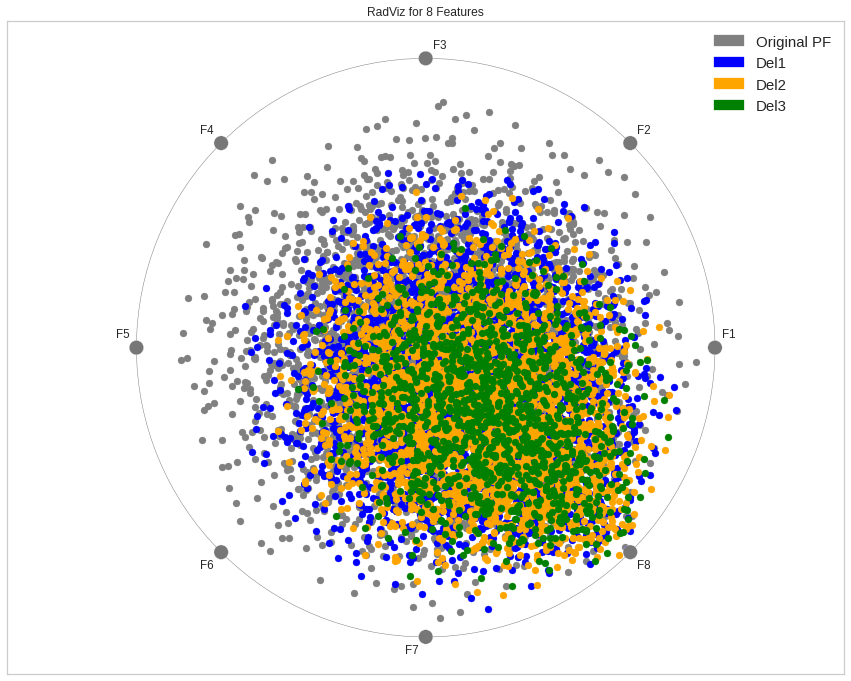

In [ ]:
from yellowbrick.features import RadViz
import matplotlib.pyplot as plt
import matplotlib
from yellowbrick.style.palettes import PALETTES, SEQUENCES, color_palette

# Load the classification dataset
X = df[['F1', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8']]
y = df['Category']

classes = ["Original PF","Del1","Del2","Del3"]

# Instantiate the visualizer
fig, axes = plt.subplots(figsize=(15,12))
visualizer = RadViz(classes=classes, colors = {'gray','blue','orange','green'}, alpha = 1.0)

visualizer.fit(X, y)           # Fit the data to the visualizer
visualizer.transform(X)        # Transform the data

matplotlib.rc('font', size=14)
matplotlib.rc('legend', fontsize=15)
visualizer.show()              # Finalize and render the figure

In [ ]:
from google.colab import files
uploaded = files.upload()


Saving T2_Obj8_Del.xlsx to T2_Obj8_Del.xlsx


In [ ]:
import io
import pandas as pd
df = pd.read_excel(io.BytesIO(uploaded['T2_Obj8_Del.xlsx']))
df.head()

,F1,F2,F3,F4,F5,F6,F7,F8,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,Category
0,0.134552,0.560692,0.000691,0.113936,0.002255,0.005673,0.002865,8.227098,0.134552,0.560692,0.000691,0.113936,0.002255,0.005673,0.002865,0.850416,0.000066,0.001865,0.0
1,0.067263,0.064866,0.004494,0.000504,0.003897,0.199121,0.063812,8.560637,0.067263,0.064866,0.004494,0.000504,0.003897,0.199121,0.063812,0.851845,-0.002162,-0.003917,0.0
2,0.109312,0.001813,0.002298,0.257365,0.266308,0.000208,0.004456,8.399420,0.109312,0.001813,0.002298,0.257365,0.266308,0.000208,0.004456,0.851179,0.001022,-0.006511,0.0
3,0.012889,0.044381,0.333339,0.012349,0.005378,0.331744,0.126304,7.924869,0.012889,0.044381,0.333339,0.012349,0.005378,0.331744,0.126304,0.850617,0.008292,-0.001210,0.0
4,0.051925,0.115917,0.003163,0.073664,0.007361,0.000904,0.104814,8.571506,0.051925,0.115917,0.003163,0.073664,0.007361,0.000904,0.104814,0.850219,-0.002996,-0.005797,0.0


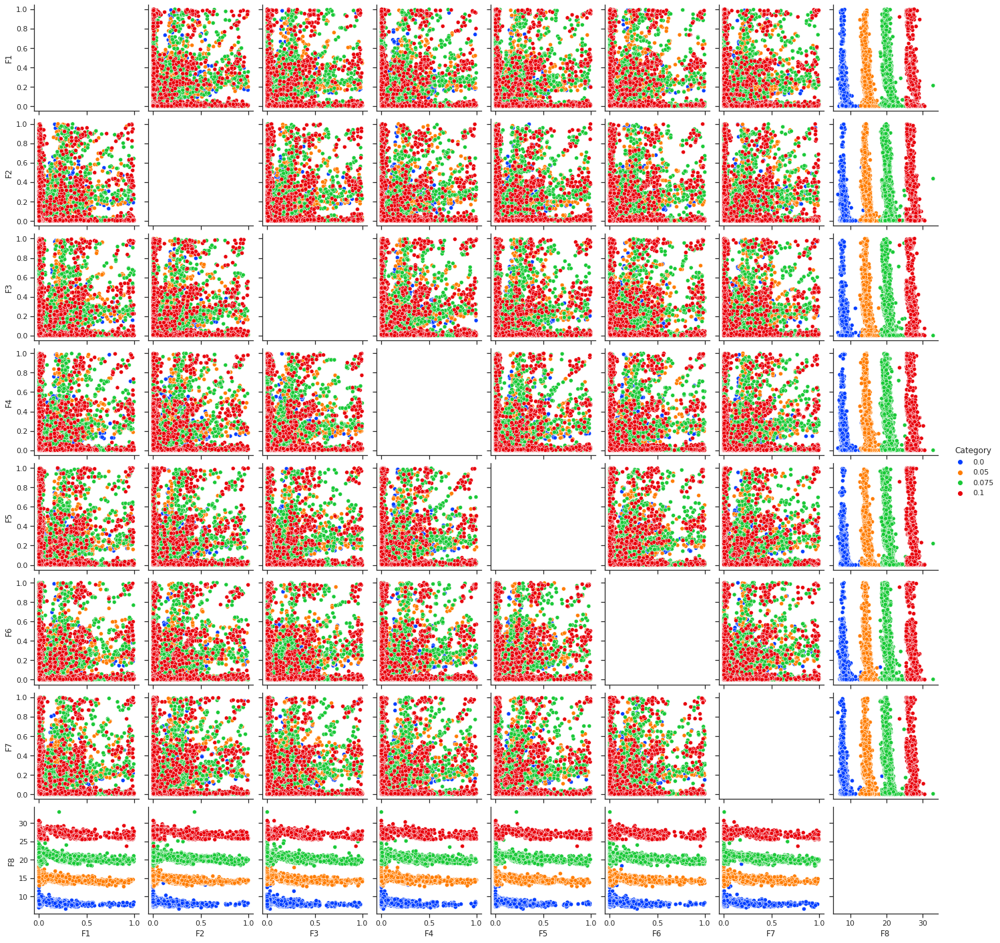

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="ticks")
df1 = df[['F1', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8','Category']]
sns.pairplot(df1, diag_kind = "None", hue="Category", palette="bright")

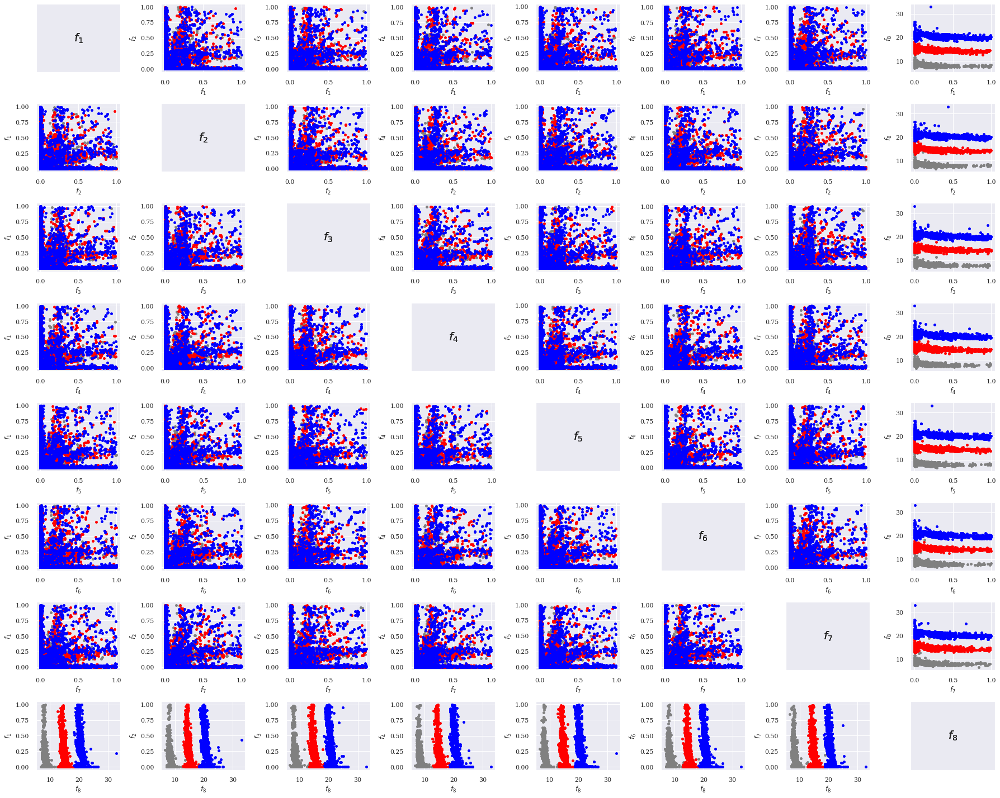

In [ ]:
plot = Scatter(tight_layout=True,figsize=(25, 20))
A1 = np.array(df.values.tolist())
plot.add(A1[np.where(A1[:,18]==0),0:8], s=15, color="gray")
plot.add(A1[np.where(A1[:,18]==0.5),0:8], s=15, color="red")
plot.add(A1[np.where(A1[:,18]==1.0),0:8], s=15, color="blue")

plot.show()

# **TYPE-II ROBUSTNESS**

## **2-Objective Problem**

### **Test Case I:** $\eta$ = [0.7, 0.6, 0.5, 0.4]; H = 100

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=5,
                         n_obj=2,
                         n_constr=1,
                         xl=np.array([0, -1, -1, -1, -1]),
                         xu=np.array([1, 1, 1, 1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):

        f1 = x[0]
        h = 1-x[0]**2
        g = 40 + x[1]**2 + x[2]**2 + x[3]**2 + x[4]**2 - 10*np.cos(4*ma.pi*x[1]) - 10*np.cos(4*ma.pi*x[2]) - 10*np.cos(4*ma.pi*x[3]) - 10*np.cos(4*ma.pi*x[4])
        S = 1/(0.2 + x[0]) + x[0]**2
        f2 = h + g*S


        H = 100; delta = 0.007; delta1 = 2*delta; alpha = 1; beta = 1;
        lb = x - [delta, delta1, delta1, delta1, delta1]
        ub = x + [delta, delta1, delta1, delta1, delta1]
        sampler = qmc.LatinHypercube(d=5)
        sample = sampler.random(n=100)
        xe = qmc.scale(sample, lb, ub)

        f1_e = np.mean(O2T1_obj1(xe))
        f2_e = np.mean(O2T1_obj2(xe, 1, 1))

        g1 = np.linalg.norm(np.array([f1,f2])-np.array([f1_e,f2_e]))/np.linalg.norm(np.array([f1,f2])) -  0.4

        out["F"] = [f1, f2]
        out["G"] = [g1]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 2, n_partitions=99)

# create the algorithm object
algorithm = NSGA3(pop_size=100, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=200)
res3 = minimize(problem,
               algorithm,
               ("n_gen", 500),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |     cv_min    |     cv_avg    |      eps      |   indicator  
     1 |      100 |      5 |  0.000000E+00 |  0.000000E+00 |             - |             -
     2 |      200 |      8 |  0.000000E+00 |  0.000000E+00 |  0.0043161564 |         nadir
     3 |      300 |      8 |  0.000000E+00 |  0.000000E+00 |  0.0557913884 |         ideal
     4 |      400 |      7 |  0.000000E+00 |  0.000000E+00 |  0.0819958105 |         ideal
     5 |      500 |      4 |  0.000000E+00 |  0.000000E+00 |  0.0091267342 |         nadir
     6 |      600 |      6 |  0.000000E+00 |  0.000000E+00 |  0.0155733235 |         ideal
     7 |      700 |      4 |  0.000000E+00 |  0.000000E+00 |  0.0419610560 |         nadir
     8 |      800 |      6 |  0.000000E+00 |  0.000000E+00 |  0.0455333692 |         ideal
     9 |      900 |      4 |  0.000000E+00 |  0.000000E+00 |  0.1029916125 |         nadir
    10 |     1000 |      5 |  0.000000E+00 |  0.000000E+00 |  0.0578555987 |             f

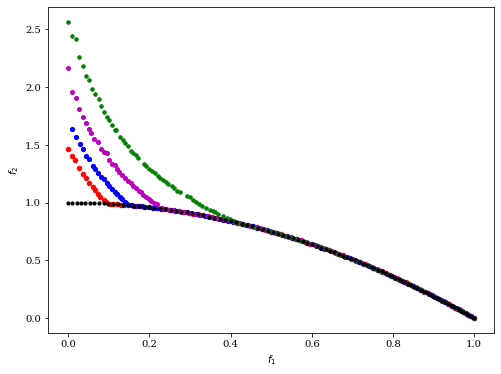

In [ ]:
plot = Scatter()
res1.F = res1.F[res1.F[:,1]<2]
res2.F = res2.F[res2.F[:,1]<3]
res3.F = res3.F[res3.F[:,1]<3]
plot.add(res.F, s=20, facecolors='r', edgecolors='r')
plot.add(res1.F, s=18, facecolors='b', edgecolors='b')
plot.add(res2.F, s=16, facecolors='m', edgecolors='m')
plot.add(res3.F, s=12, facecolors='g', edgecolors='g')
plot.add(res_act.F, s=10, facecolors='k', edgecolors='k')
plot.show()

### **Test Case II:** $\eta$ = [0.4, 0.6]; H = 100

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=5,
                         n_obj=2,
                         n_constr=1,
                         xl=np.array([0, -1, -1, -1, -1]),
                         xu=np.array([1, 1, 1, 1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):
        alpha = 1; beta = 10;
        f1 = x[0]
        h = 1-x[0]**2
        g = 40 + x[1]**2 + x[2]**2 + x[3]**2 + x[4]**2 - 10*np.cos(4*ma.pi*x[1]) - 10*np.cos(4*ma.pi*x[2]) - 10*np.cos(4*ma.pi*x[3]) - 10*np.cos(4*ma.pi*x[4])
        S = alpha/(0.2 + x[0]) + beta*x[0]**2
        f2 = h + g*S

        H = 100; delta = 0.006; delta1 = 2*delta; alpha = 1; beta = 10;
        lb = x - [delta, delta1, delta1, delta1, delta1]
        ub = x + [delta, delta1, delta1, delta1, delta1]
        sampler = qmc.LatinHypercube(d=5)
        sample = sampler.random(n=100)
        xe = qmc.scale(sample, lb, ub)

        f1_e = np.mean(O2T1_obj1(xe))
        f2_e = np.mean(O2T1_obj2(xe, 1, 10))

        g1 = np.linalg.norm(np.array([f1,f2])-np.array([f1_e,f2_e]))/np.linalg.norm(np.array([f1,f2])) -  0.4

        out["F"] = [f1, f2]
        out["G"] = [g1]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 2, n_partitions=99)

# create the algorithm object
algorithm = NSGA3(pop_size=100, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=200)
res1 = minimize(problem,
               algorithm,
               ("n_gen", 500),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |     cv_min    |     cv_avg    |      eps      |   indicator  
     1 |      100 |      5 |  0.000000E+00 |  0.000000E+00 |             - |             -
     2 |      200 |      5 |  0.000000E+00 |  0.000000E+00 |  0.0094730527 |         ideal
     3 |      300 |      4 |  0.000000E+00 |  0.000000E+00 |  0.0945705333 |         ideal
     4 |      400 |      7 |  0.000000E+00 |  0.000000E+00 |  0.0888968911 |         ideal
     5 |      500 |      4 |  0.000000E+00 |  0.000000E+00 |  0.3194628123 |         nadir
     6 |      600 |      6 |  0.000000E+00 |  0.000000E+00 |  1.0670281578 |         nadir
     7 |      700 |      5 |  0.000000E+00 |  0.000000E+00 |  0.0140316639 |         ideal
     8 |      800 |      5 |  0.000000E+00 |  0.000000E+00 |  6.2404479246 |         nadir
     9 |      900 |      5 |  0.000000E+00 |  0.000000E+00 |  0.0439052118 |         ideal
    10 |     1000 |      5 |  0.000000E+00 |  0.000000E+00 |  0.0186888116 |             f

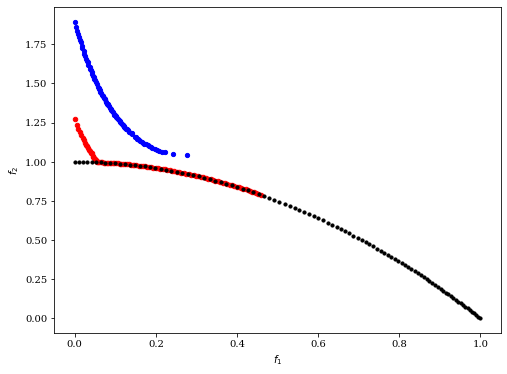

In [ ]:
plot = Scatter()
res.F = res.F[res.F[:,1]<2]
res1.F = res1.F[res1.F[:,1]<2]

plot.add(res.F, s=20, facecolors='r', edgecolors='r')
plot.add(res1.F, s=18, facecolors='b', edgecolors='b')
plot.add(res_act.F, s=10, facecolors='k', edgecolors='k')
plot.show()

### **Test Case III:** $\eta$ = [0.7, 0.3, 0.2]; H = 50; $\delta$ = 0.03

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=5,
                         n_obj=2,
                         n_constr=1,
                         xl=np.array([0, 0, -1, -1, -1]),
                         xu=np.array([1, 1, 1, 1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):
        f1 = x[0]
        h = 2 - 0.8*ma.exp(-((x[1]-0.35)/0.25)**2) - ma.exp(-((x[1]-0.85)/0.03)**2)
        g = 50*(x[2]**2 + x[3]**2 + x[4]**2)
        S = 1 - x[0]**0.5
        f2 = h*(g + S)

        H = 50; delta = 0.03; delta1 = 2*delta;
        lb = x - [delta, delta, delta1, delta1, delta1]
        ub = x + [delta, delta, delta1, delta1, delta1]
        sampler = qmc.LatinHypercube(d=5)
        sample = sampler.random(n=50)
        xe = qmc.scale(sample, lb, ub)

        f1_e = np.mean(obj1t3(xe))
        f2_e = np.mean(obj2t3(xe))

        g1 = np.linalg.norm(np.array([f1,f2])-np.array([f1_e,f2_e]))/np.linalg.norm(np.array([f1,f2])) -  0.2

        out["F"] = [f1, f2]
        out["G"] = [g1]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 2, n_partitions=199)

# create the algorithm object
algorithm = NSGA3(pop_size=200, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=200)
res2 = minimize(problem,
               algorithm,
               ("n_gen", 1000),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |     cv_min    |     cv_avg    |      eps      |   indicator  
     1 |      200 |      5 |  0.000000E+00 |  0.0004172329 |             - |             -
     2 |      400 |      7 |  0.000000E+00 |  0.000000E+00 |  0.0088039359 |         ideal
     3 |      600 |      5 |  0.000000E+00 |  0.000000E+00 |  0.0343608732 |             f
     4 |      800 |      6 |  0.000000E+00 |  0.000000E+00 |  0.0286735051 |         nadir
     5 |     1000 |      8 |  0.000000E+00 |  0.000000E+00 |  0.0273152151 |             f
     6 |     1200 |      4 |  0.000000E+00 |  0.000000E+00 |  3.4691543221 |         nadir
     7 |     1400 |      5 |  0.000000E+00 |  0.000000E+00 |  4.7209630814 |         nadir
     8 |     1600 |      6 |  0.000000E+00 |  0.000000E+00 |  0.0822737582 |         ideal
     9 |     1800 |      7 |  0.000000E+00 |  0.000000E+00 |  0.0159929942 |             f
    10 |     2000 |      5 |  0.000000E+00 |  0.000000E+00 |  0.000000E+00 |             f

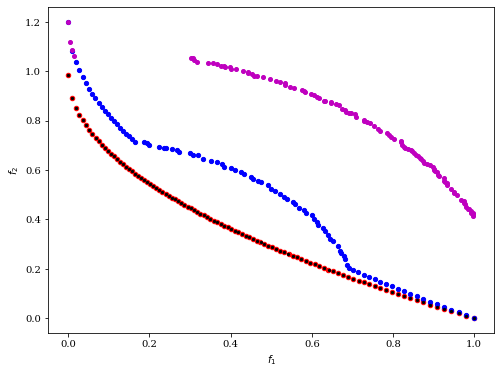

In [ ]:
plot = Scatter()
res.F = res.F[res.F[:,1]<2]
res1.F = res1.F[res1.F[:,1]<2]
res2.F = res2.F[res2.F[:,1]<2]

plot.add(res.F, s=20, facecolors='r', edgecolors='r')
plot.add(res1.F, s=18, facecolors='b', edgecolors='b')
plot.add(res2.F, s=16, facecolors='m', edgecolors='m')
plot.add(res_act.F, s=5, facecolors='k', edgecolors='k')
plot.show()

### **Test Case IV:** $\eta$ = [0.7, 0.3, 0.2]; H = 50; $\delta$ = 0.03

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=5,
                         n_obj=2,
                         n_constr=1,
                         xl=np.array([0, -0.15, -1, -1, -1]),
                         xu=np.array([1, 1, 1, 1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):
        f1 = x[0]
        h = 2 - 0.8*ma.exp(-((x[0] + x[1]-0.35)/0.25)**2) - ma.exp(-((x[0] + x[1]-0.85)/0.03)**2)
        g = 50*(x[2]**2 + x[3]**2 + x[4]**2)
        S = 1 - x[0]**0.5
        f2 = h*(g + S)

        H = 50; delta = 0.03; delta1 = 2*delta;
        lb = x - [delta, delta, delta1, delta1, delta1]
        ub = x + [delta, delta, delta1, delta1, delta1]
        sampler = qmc.LatinHypercube(d=5)
        sample = sampler.random(n=50)
        xe = qmc.scale(sample, lb, ub)

        f1_e = np.mean(obj1t4(xe))
        f2_e = np.mean(obj2t4(xe))

        g1 = np.linalg.norm(np.array([f1,f2])-np.array([f1_e,f2_e]))/np.linalg.norm(np.array([f1,f2])) -  0.3

        out["F"] = [f1, f2]
        out["G"] = [g1]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 2, n_partitions=199)

# create the algorithm object
algorithm = NSGA3(pop_size=200, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=100)
res1 = minimize(problem,
               algorithm,
               ("n_gen", 500),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |     cv_min    |     cv_avg    |      eps      |   indicator  
     1 |      200 |      5 |  0.000000E+00 |  0.000000E+00 |             - |             -
     2 |      400 |      5 |  0.000000E+00 |  0.000000E+00 |  0.0122854946 |         ideal
     3 |      600 |      3 |  0.000000E+00 |  0.000000E+00 |  0.9475498082 |         nadir
     4 |      800 |      4 |  0.000000E+00 |  0.000000E+00 |  0.0035607678 |         ideal
     5 |     1000 |      6 |  0.000000E+00 |  0.000000E+00 |  0.0325176594 |         nadir
     6 |     1200 |      7 |  0.000000E+00 |  0.000000E+00 |  0.0541546723 |             f
     7 |     1400 |      7 |  0.000000E+00 |  0.000000E+00 |  2.001525E+01 |         nadir
     8 |     1600 |      3 |  0.000000E+00 |  0.000000E+00 |  0.0245275704 |             f
     9 |     1800 |      5 |  0.000000E+00 |  0.000000E+00 |  4.9767866211 |         nadir
    10 |     2000 |      8 |  0.000000E+00 |  0.000000E+00 |  0.0091714006 |         ideal

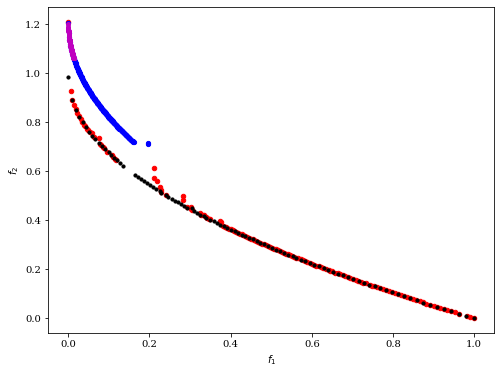

In [ ]:
plot = Scatter()
res.F = res.F[res.F[:,1]<1.5]
res1.F = res1.F[res1.F[:,1]<2]
res2.F = res2.F[res2.F[:,1]<2]

plot.add(res.F, s=20, facecolors='r', edgecolors='r')
plot.add(res1.F, s=18, facecolors='b', edgecolors='b')
plot.add(res2.F, s=16, facecolors='m', edgecolors='m')
plot.add(res_act.F, s=10, facecolors='k', edgecolors='k')
plot.show()

## **3-Objective Problem**

### **Test Case I:** $\eta$ = [2, 0.4]; H = 50; $\delta$ = 0.01

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=5,
                         n_obj=3,
                         n_constr=1,
                         xl=np.array([0, 0, -1, -1, -1]),
                         xu=np.array([1, 1, 1, 1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):
        alpha = 0.75; beta = 10;
        f1 = x[0]
        f2 = x[1]
        h = 2-x[0]**2-x[1]**2
        g = 30 + x[2]**2 + x[3]**2 + x[4]**2 - 10*np.cos(4*ma.pi*x[2]) - 10*np.cos(4*ma.pi*x[3]) - 10*np.cos(4*ma.pi*x[4])
        S = alpha/(0.2 + x[0]) + beta*x[0]**8 + alpha/(0.2 + x[1]) + beta*x[1]**8
        f3 = h + g*S

        H = 50; delta = 0.01; delta1 = 2*delta;
        lb = x - [delta, delta, delta1, delta1, delta1]
        ub = x + [delta, delta, delta1, delta1, delta1]
        sampler = qmc.LatinHypercube(d=5)
        sample = sampler.random(n=50)
        xe = qmc.scale(sample, lb, ub)

        f1_e = np.mean(O3T1_obj1(xe))
        f2_e = np.mean(O3T1_obj2(xe))
        f3_e = np.mean(O3T1_obj3(xe, 0.75, 10))

        g1 = np.linalg.norm(np.array([f1,f2,f3])-np.array([f1_e,f2_e,f3_e]))/np.linalg.norm(np.array([f1,f2,f3])) -  0.4

        out["F"] = [f1, f2, f3]
        out["G"] = [g1]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 3, n_partitions=50)

# create the algorithm object
algorithm = NSGA3(pop_size=1326, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=200)
res1 = minimize(problem,
               algorithm,
               ("n_gen", 200),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |     cv_min    |     cv_avg    |      eps      |   indicator  
     1 |     1326 |     40 |  0.000000E+00 |  0.000000E+00 |             - |             -
     2 |     2652 |     47 |  0.000000E+00 |  0.000000E+00 |  0.0055234324 |         ideal
     3 |     3978 |     44 |  0.000000E+00 |  0.000000E+00 |  0.1051604366 |         nadir
     4 |     5304 |     49 |  0.000000E+00 |  0.000000E+00 |  0.0266427992 |         nadir
     5 |     6630 |     52 |  0.000000E+00 |  0.000000E+00 |  0.1375245145 |         nadir
     6 |     7956 |     40 |  0.000000E+00 |  0.000000E+00 |  0.2771664744 |         nadir
     7 |     9282 |     40 |  0.000000E+00 |  0.000000E+00 |  0.0040116894 |         ideal
     8 |    10608 |     36 |  0.000000E+00 |  0.000000E+00 |  0.2356498847 |         nadir
     9 |    11934 |     25 |  0.000000E+00 |  0.000000E+00 |  0.2133713897 |         nadir
    10 |    13260 |     27 |  0.000000E+00 |  0.000000E+00 |  0.0782362142 |         nadir

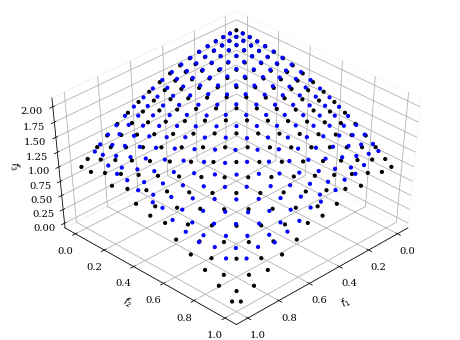

In [ ]:
plot = Scatter()
res.F = res.F[res.F[:,2]<5]
res1.F = res1.F[res1.F[:,2]<5]
plot.add(res_act.F, s=10, facecolors='k', edgecolors='k')
plot.add(res.F, s=10, facecolors='b', edgecolors='b')
#plot.add(res1.F, s=10, facecolors='r', edgecolors='r')
plot.show()

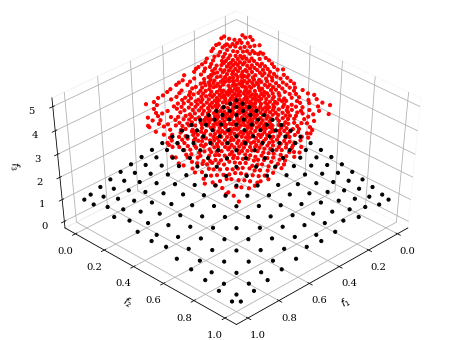

In [ ]:
plot = Scatter()
res.F = res.F[res.F[:,2]<5]
res1.F = res1.F[res1.F[:,2]<5]
plot.add(res_act.F, s=10, facecolors='k', edgecolors='k')
#plot.add(res.F, s=10, facecolors='b', edgecolors='b')
plot.add(res1.F, s=10, facecolors='r', edgecolors='r')
plot.show()

## **4-Objective Problem**

### **$\eta$ = [0.4, 0.6, 1]**

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=5,
                         n_obj=4,
                         n_constr=1,
                         xl=np.array([0, 0, 0, -1, -1]),
                         xu=np.array([1, 1, 1, 1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):
        alpha = 0.75; beta = 10;
        f1 = x[0]
        f2 = x[1]
        f3 = x[2]
        h = 3 - x[0]**2 - x[1]**2 - x[2]**2
        g = 20 + x[3]**2 + x[4]**2 - 10*np.cos(4*ma.pi*x[3]) - 10*np.cos(4*ma.pi*x[4])
        S = alpha/(0.2 + x[0]) + beta*x[0]**8 + alpha/(0.2 + x[1]) + beta*x[1]**8 + alpha/(0.2 + x[2]) + beta*x[2]**8
        f4 = h + g*S

        H = 50; delta = 0.01; delta1 = 2*delta;
        lb = x - [delta, delta, delta, delta1, delta1]
        ub = x + [delta, delta, delta, delta1, delta1]
        sampler = qmc.LatinHypercube(d=5)
        sample = sampler.random(n=50)
        xe = qmc.scale(sample, lb, ub)

        f1_e = np.mean(O4T1_obj1(xe))
        f2_e = np.mean(O4T1_obj2(xe))
        f3_e = np.mean(O4T1_obj3(xe))
        f4_e = np.mean(O4T1_obj4(xe, 0.75, 10))

        g1 = np.linalg.norm(np.array([f1,f2,f3,f4])-np.array([f1_e,f2_e,f3_e,f4_e]))/np.linalg.norm(np.array([f1,f2,f3,f4])) -  0.4

        out["F"] = [f1, f2, f3, f4]
        out["G"] = [g1]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 4, n_partitions=10)

# create the algorithm object
algorithm = NSGA3(pop_size=900, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=200)
res1 = minimize(problem,
               algorithm,
               ("n_gen", 200),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |     cv_min    |     cv_avg    |      eps      |   indicator  
     1 |      900 |     28 |  0.000000E+00 |  0.000000E+00 |             - |             -
     2 |     1800 |     50 |  0.000000E+00 |  0.000000E+00 |  0.0030168614 |         ideal
     3 |     2700 |     30 |  0.000000E+00 |  0.000000E+00 |  0.0056140040 |         ideal
     4 |     3600 |     38 |  0.000000E+00 |  0.000000E+00 |  0.0145393802 |         ideal
     5 |     4500 |     49 |  0.000000E+00 |  0.000000E+00 |  0.3349576097 |         nadir
     6 |     5400 |     71 |  0.000000E+00 |  0.000000E+00 |  0.5690702376 |         nadir
     7 |     6300 |     67 |  0.000000E+00 |  0.000000E+00 |  0.9005922205 |         nadir
     8 |     7200 |     50 |  0.000000E+00 |  0.000000E+00 |  0.5018810441 |         nadir
     9 |     8100 |     62 |  0.000000E+00 |  0.000000E+00 |  0.5530293156 |         nadir
    10 |     9000 |     42 |  0.000000E+00 |  0.000000E+00 |  0.4268231221 |         nadir

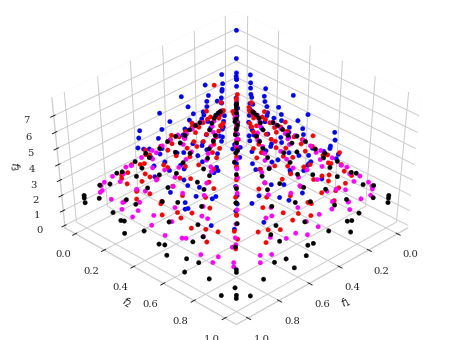

In [ ]:
plot = Scatter()
res1.F = res1.F[res1.F[:,3]<20]
res2.F = res2.F[res2.F[:,3]<20]
res3.F = res3.F[res3.F[:,3]<20]
plot.add(res_act.F[:,[0,2,3]], color="black")
plot.add(res1.F[:,[0,2,3]], color="blue")
plot.add(res2.F[:,[0,2,3]], color="red")
plot.add(res3.F[:,[0,2,3]], color="magenta")
plot.show()

In [ ]:
import pandas as pd
import numpy as np
from google.colab import files
res.X = res.X[np.where(res.F[:,3]<5)]
#res1.X = res1.X[np.where(res1.F[:,3]<5)]
#res2.X = res2.X[np.where(res2.F[:,3]<15)]
#res_act.X = res_act.X[np.where(res_act.F[:,3]<3.5)]

T1_Obj4 = pd.DataFrame(np.concatenate((res2.F,res2.X),axis=1))

T1_Obj4.to_csv("T1_Obj4.csv")
files.download("T1_Obj4.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### **Hyper Volume Calculation**

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving T1_Obj4_eta3.csv to T1_Obj4_eta3.csv


In [ ]:
import io
import pandas as pd
df = pd.read_csv(io.BytesIO(uploaded['T1_Obj4_eta3.csv']))
df.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8
0,0,0.785110,0.786057,0.413375,1.594997,0.785110,0.786057,0.413375,-0.000084,0.000169
1,1,0.752429,0.026345,0.154987,2.411819,0.752429,0.026345,0.154987,0.000053,0.000683
2,2,0.439986,0.000026,0.111670,2.793953,0.439986,0.000026,0.111670,-0.000022,0.000038
3,3,0.770823,0.481599,0.009543,2.175132,0.770823,0.481599,0.009543,0.000357,0.000349
4,4,0.000331,0.092281,0.000154,3.506385,0.000331,0.092281,0.000154,0.005388,-0.005980


In [ ]:
A = np.array(df[['0','1','2','3']].values.tolist())

In [ ]:
from pymoo.indicators.hv import HV

ref_point = np.array([1.1,1.1,1.1,13.5])

ind = HV(ref_point=ref_point)
print("HV", ind(A))

HV 15.038929159022366


In [ ]:
A = np.array(df[['F1','F2','F3','F4']].values.tolist())
ref_point = np.zeros(4)
for i in range(0,4):
  ref_point[i] = max(A[:,i]) + 0.1*(max(A[:,i]) - min(A[:,i]))
ref_point

## **8-Objective Problem**

### **$\eta$ = 0.2,0.3,0.4**

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=10,
                         n_obj=8,
                         n_constr=1,
                         xl=np.array([0, 0, 0, 0, 0, 0, 0, 0, -1, -1]),
                         xu=np.array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):

        f1 = x[0]
        f2 = x[1]
        f3 = x[2]
        f4 = x[3]
        f5 = x[4]
        f6 = x[5]
        f7 = x[6]
        h = 2 - 0.8*ma.exp(-((x[7] -0.35)/0.25)**2) - ma.exp(-((x[7] -0.85)/0.03)**2)
        g =  20 + x[8]**2 + x[9]**2 - 10*np.cos(4*ma.pi*x[8]) - 10*np.cos(4*ma.pi*x[9])
        S = 10 - x[0]**0.5 - x[1]**0.5 - x[2]**0.5 - x[3]**0.5 - x[4]**0.5 - x[5]**0.5 - x[6]**0.5
        f8 = h*(g + S)

        delta = 0.05; delta1 = 2*delta;
        lb = x - [delta, delta, delta, delta, delta, delta, delta, delta, delta1, delta1]
        ub = x + [delta, delta, delta, delta, delta, delta, delta, delta, delta1, delta1]
        sampler = qmc.LatinHypercube(d=10)
        sample = sampler.random(n=100)
        xe = qmc.scale(sample, lb, ub)

        f1_e = np.mean(O8T1_obj1(xe))
        f2_e = np.mean(O8T1_obj2(xe))
        f3_e = np.mean(O8T1_obj3(xe))
        f4_e = np.mean(O8T1_obj4(xe))
        f5_e = np.mean(O8T1_obj5(xe))
        f6_e = np.mean(O8T1_obj6(xe))
        f7_e = np.mean(O8T1_obj7(xe))
        f8_e = np.mean(O8T1_obj8(xe))

        g1 = np.linalg.norm(np.array([f1,f2,f3,f4,f5,f6,f7,f8])-np.array([f1_e,f2_e,f3_e,f4_e,f5_e,f6_e,f7_e,f8_e]))/np.linalg.norm(np.array([f1,f2,f3,f4,f5,f6,f7,f8])) -  0.4

        out["F"] = [f1, f2, f3, f4, f5, f6, f7, f8]
        out["G"] = [g1]



problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 8, n_partitions=6)

algorithm = NSGA3(pop_size=1750, ref_dirs=ref_dirs)
# algorithm = NSGA2(pop_size=200)
res3 = minimize(problem,
               algorithm,
               ("n_gen", 100),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |     cv_min    |     cv_avg    |      eps      |   indicator  
     1 |     1750 |    220 |  0.000000E+00 |  0.0132030904 |             - |             -
     2 |     3500 |    263 |  0.000000E+00 |  0.000000E+00 |  0.0045373561 |         ideal
     3 |     5250 |    323 |  0.000000E+00 |  0.000000E+00 |  0.0120641497 |         ideal
     4 |     7000 |    394 |  0.000000E+00 |  0.000000E+00 |  0.0051892544 |         ideal
     5 |     8750 |    332 |  0.000000E+00 |  0.000000E+00 |  0.0027203673 |         ideal
     6 |    10500 |    360 |  0.000000E+00 |  0.000000E+00 |  0.0028645580 |         ideal
     7 |    12250 |    268 |  0.000000E+00 |  0.000000E+00 |  0.0060701021 |         ideal
     8 |    14000 |    226 |  0.000000E+00 |  0.000000E+00 |  0.0057701933 |         ideal
     9 |    15750 |    151 |  0.000000E+00 |  0.000000E+00 |  0.0063856058 |         ideal
    10 |    17500 |    213 |  0.000000E+00 |  0.000000E+00 |  0.0116710726 |         ideal

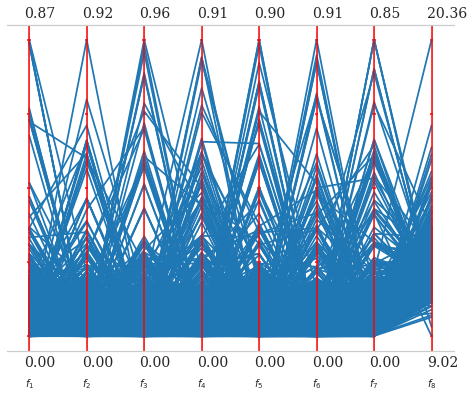

In [ ]:
from pymoo.visualization.pcp import PCP
#res4.F = res4.F[np.where(res4.F[:,7]<24)]
PCP().add(res3.F).show()

In [ ]:
import pandas as pd
import numpy as np
from google.colab import files
#res4.X = res4.X[np.where(res4.F[:,7]<24)]
Obj8_eta3 = pd.DataFrame(np.concatenate((res3.F,res3.X),axis=1))
Obj8_eta3.to_csv("Obj8_eta3.csv")
files.download("Obj8_eta3.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Real-World Engineering Problem**

## Crash-worthiness Problem

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=5,
                         n_obj=3,
                         n_constr=0,
                         xl=np.array([1, 1, 1, 1, 1]),
                         xu=np.array([3, 3, 3, 3, 3]))

    def _evaluate(self, x, out, *args, **kwargs):
        f1 = (1640.2823 + 2.3573285*x[0] + 2.3220035*x[1] + 4.5688768*x[2] + 7.7213633*x[3] + 4.4559504*x[4] - 1660)/30
        f2 = (6.5856 + 1.15*x[0] - 1.0427*x[1] + 0.9738*x[2] +0.8364*x[3]- 0.3695*x[0]*x[3] + 0.0861*x[0]*x[4] + 0.3628*x[1]*x[3] - 0.1106*(x[0]**2) - 0.3437*(x[2]**2) + 0.1764*(x[3]**2) - 6)/4
        f3 = (-0.0551 + 0.0181*x[0] + 0.1024*x[1] + 0.0421*x[2] - 0.0073*x[0]*x[1] + 0.024*x[1]*x[2] - 0.0118*x[1]*x[3] - 0.0204*x[2]*x[3] - 0.008*x[2]*x[4] -0.0241*(x[1]**2) + 0.0109*(x[3]**2))/0.25
        out["F"] = [f1, f2, f3]
problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 3, n_partitions=50)

# create the algorithm object
algorithm = NSGA3(pop_size=1326, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=100)
res = minimize(problem,
               algorithm,
               ("n_gen", 100),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |     1326 |     31 |             - |             -
     2 |     2652 |     35 |  0.0700792372 |         ideal
     3 |     3978 |     32 |  0.0451011585 |         ideal
     4 |     5304 |     43 |  0.0249215503 |         ideal
     5 |     6630 |     34 |  0.0309566538 |         ideal
     6 |     7956 |     43 |  0.0261760104 |         ideal
     7 |     9282 |     64 |  0.0392732326 |         ideal
     8 |    10608 |     64 |  0.0588484765 |         ideal
     9 |    11934 |     74 |  0.0138198959 |         ideal
    10 |    13260 |    104 |  0.0056966976 |         ideal
    11 |    14586 |    105 |  0.0162444821 |         ideal
    12 |    15912 |    114 |  0.0245091531 |             f
    13 |    17238 |    162 |  0.0083677044 |         ideal
    14 |    18564 |    153 |  0.0144505824 |         ideal
    15 |    19890 |    175 |  0.0052388031 |         ideal
    16 |    21216 |    209 |  0.0132335759 |         ide

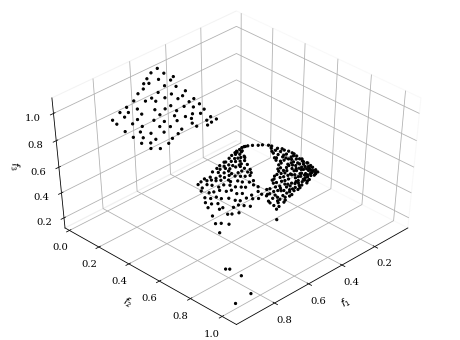

In [ ]:
plot = Scatter()
plot.add(res.F, s=5, facecolors='k', edgecolors='k')
plot.show()

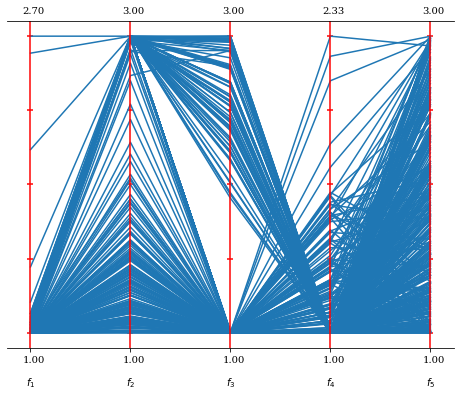

In [ ]:
from pymoo.visualization.pcp import PCP
PCP().add(res.X).show()

## Robust Design for Crash-worthiness Problem: Type I Robustness

In [ ]:
def crash_obj1(x):
  f_1 = 1640.2823 + 2.3573285*x[:,0] + 2.3220035*x[:,1] + 4.5688768*x[:,2] + 7.7213633*x[:,3] + 4.4559504*x[:,4]
  return (f_1 - 1660)/30

def crash_obj2(x):
  f_2 = (6.5856 + 1.15*x[:,0] - 1.0427*x[:,1] + 0.9738*x[:,2] +0.8364*x[:,3]- 0.3695*x[:,0]*x[:,3] + 0.0861*x[:,0]*x[:,4] + 0.3628*x[:,1]*x[:,3] -
        0.1106*(x[:,0]**2) - 0.3437*(x[:,2]**2) + 0.1764*(x[:,3]**2) - 6)/4
  return f_2

def crash_obj3(x):
  f_3 = (-0.0551 + 0.0181*x[:,0] + 0.1024*x[:,1] + 0.0421*x[:,2] - 0.0073*x[:,0]*x[:,1] + 0.024*x[:,1]*x[:,2] - 0.0118*x[:,1]*x[:,3] -
        0.0204*x[:,2]*x[:,3] - 0.008*x[:,2]*x[:,4] -0.0241*(x[:,1]**2) + 0.0109*(x[:,3]**2))/0.25
  return f_3

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=5,
                         n_obj=3,
                         n_constr=0,
                         xl=np.array([1, 1, 1, 1, 1]),
                         xu=np.array([3, 3, 3, 3, 3]))

    def _evaluate(self, x, out, *args, **kwargs):
        delta = 0.05
        lb = x - [delta, delta, delta, delta, delta]
        ub = x + [delta, delta, delta, delta, delta]
        sampler = qmc.LatinHypercube(d=5)
        sample = sampler.random(n=1000)
        xe = qmc.scale(sample, lb, ub)

        f1 = np.mean(crash_obj1(xe))
        f2 = np.mean(crash_obj2(xe))
        f3 = np.mean(crash_obj3(xe))

        out["F"] = [f1, f2, f3]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 3, n_partitions=50)

# create the algorithm object
algorithm = NSGA3(pop_size=1326, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=100)
res1 = minimize(problem,
               algorithm,
               ("n_gen", 100),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |     1326 |     32 |             - |             -
     2 |     2652 |     29 |  0.0246083095 |         ideal
     3 |     3978 |     31 |  0.0267987678 |         ideal
     4 |     5304 |     46 |  0.0630698588 |         ideal
     5 |     6630 |     45 |  0.0288722614 |         ideal
     6 |     7956 |     45 |  0.0760953694 |         ideal
     7 |     9282 |     50 |  0.0177313446 |         ideal
     8 |    10608 |     74 |  0.0174336265 |         ideal
     9 |    11934 |     59 |  0.0098475779 |         ideal
    10 |    13260 |    102 |  0.0198964536 |         ideal
    11 |    14586 |    105 |  0.0131219059 |         ideal
    12 |    15912 |    113 |  0.0127073788 |         ideal
    13 |    17238 |    170 |  0.0261063606 |         ideal
    14 |    18564 |    167 |  0.0108473347 |         ideal
    15 |    19890 |    191 |  0.0109229685 |         ideal
    16 |    21216 |    202 |  0.0066355045 |         ide

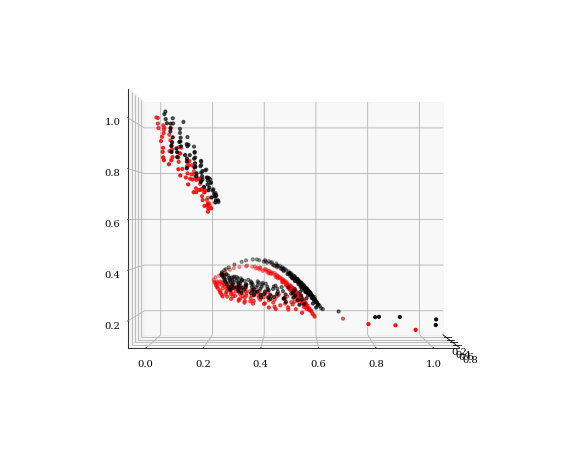

In [ ]:
from mpl_toolkits import mplot3d
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(10, 8))
ax = plt.axes(projection='3d')
ax.scatter(res.F[:,0], res.F[:,1], res.F[:,2], s=10, color="black");
ax.scatter(res1.F[:,0], res1.F[:,1], res1.F[:,2], s=10, color="red");
#ax.scatter(res2.F[:,0], res2.F[:,1], res2.F[:,2], s=10, color="blue");
ax.view_init(0, 0)

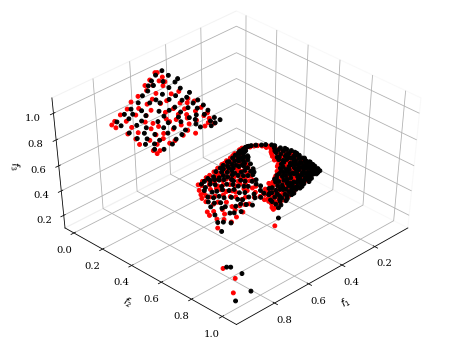

In [ ]:
plot = Scatter()
plot.add(res.F, s=15, facecolors='k', edgecolors='k')
plot.add(res1.F, s=15, facecolors='r', edgecolors='r')
#plot.add(res2.F, s=15, facecolors='b', edgecolors='b')
plot.show()

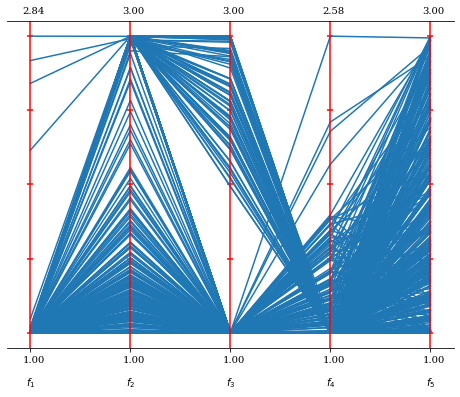

In [ ]:
from pymoo.visualization.pcp import PCP
PCP().add(res1.X).show()

## Robust Design for Crash-worthiness Problem: Type II Robustness

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=5,
                         n_obj=3,
                         n_constr=1,
                         xl=np.array([1, 1, 1, 1, 1]),
                         xu=np.array([3, 3, 3, 3, 3]))

    def _evaluate(self, x, out, *args, **kwargs):
        f1 = (1640.2823 + 2.3573285*x[0] + 2.3220035*x[1] + 4.5688768*x[2] + 7.7213633*x[3] + 4.4559504*x[4] - 1660)/30
        f2 = (6.5856 + 1.15*x[0] - 1.0427*x[1] + 0.9738*x[2] +0.8364*x[3]- 0.3695*x[0]*x[3] + 0.0861*x[0]*x[4] + 0.3628*x[1]*x[3] -
              0.1106*(x[0]**2) - 0.3437*(x[2]**2) + 0.1764*(x[3]**2) - 6)/4
        f3 = (-0.0551 + 0.0181*x[0] + 0.1024*x[1] + 0.0421*x[2] - 0.0073*x[0]*x[1] + 0.024*x[1]*x[2] - 0.0118*x[1]*x[3] - 0.0204*x[2]*x[3] -
              0.008*x[2]*x[4] -0.0241*(x[1]**2) + 0.0109*(x[3]**2))/0.25

        delta = 0.02
        lb = x - [delta, delta, delta, delta, delta]
        ub = x + [delta, delta, delta, delta, delta]
        sampler = qmc.LatinHypercube(d=5)
        sample = sampler.random(n=100)
        xe = qmc.scale(sample, lb, ub)

        f1_e = np.mean(crash_obj1(xe))
        f2_e = np.mean(crash_obj2(xe))
        f3_e = np.mean(crash_obj3(xe))

        g1 = np.linalg.norm(np.array([f1,f2,f3])-np.array([f1_e,f2_e,f3_e]))/np.linalg.norm(np.array([f1,f2,f3])) -  0.005
        out["F"] = [f1, f2, f3]
        out["G"] = [g1]


problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 3, n_partitions=50)

# create the algorithm object
algorithm = NSGA3(pop_size=1326, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=1500)
res1 = minimize(problem,
               algorithm,
               ("n_gen", 100),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |     cv_min    |     cv_avg    |      eps      |   indicator  
     1 |     1326 |     31 |  0.000000E+00 |  0.000000E+00 |             - |             -
     2 |     2652 |     35 |  0.000000E+00 |  0.000000E+00 |  0.0700792372 |         ideal
     3 |     3978 |     32 |  0.000000E+00 |  0.000000E+00 |  0.0451011585 |         ideal
     4 |     5304 |     43 |  0.000000E+00 |  0.000000E+00 |  0.0249215503 |         ideal
     5 |     6630 |     34 |  0.000000E+00 |  0.000000E+00 |  0.0309566538 |         ideal
     6 |     7956 |     43 |  0.000000E+00 |  0.000000E+00 |  0.0261760104 |         ideal
     7 |     9282 |     64 |  0.000000E+00 |  0.000000E+00 |  0.0392732326 |         ideal
     8 |    10608 |     64 |  0.000000E+00 |  0.000000E+00 |  0.0588484765 |         ideal
     9 |    11934 |     74 |  0.000000E+00 |  0.000000E+00 |  0.0138198959 |         ideal
    10 |    13260 |    104 |  0.000000E+00 |  0.000000E+00 |  0.0056966976 |         ideal

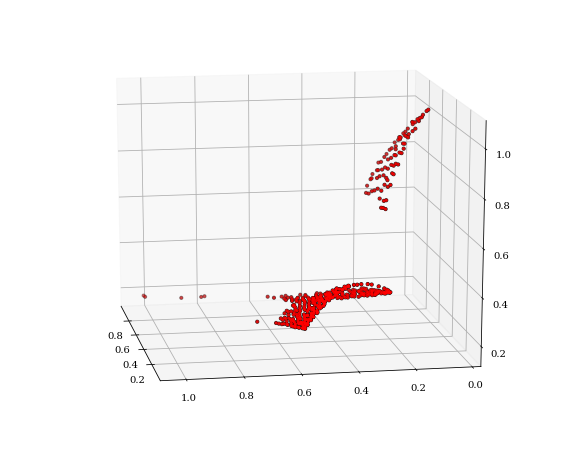

In [ ]:
from mpl_toolkits import mplot3d
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(10, 8))
ax = plt.axes(projection='3d')
ax.scatter(res.F[:,0], res.F[:,1], res.F[:,2], s=10, color="black");
ax.scatter(res1.F[:,0], res1.F[:,1], res1.F[:,2], s=5, color="red");
ax.view_init(15, 170)

## 4 bar truss problem: Type I Robustness

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=4,
                         n_obj=2,
                         n_constr=0,
                         xl=np.array([1, 2**0.5, 2**0.5, 1]),
                         xu=np.array([3, 3, 3, 3]))

    def _evaluate(self, x, out, *args, **kwargs):
        F = 10; E = 200000; L = 200; S = 10; a = F/S;
        f1 = L*(2*x[0]+ (2**0.5)*x[1] + x[2]**0.5 + x[3])
        f2 = (2*F*L/E)*(1/x[0] + (2**0.5)/x[1] - (2**0.5)/x[2] + 1/x[3])
        out["F"] = [f1, f2]
problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 2, n_partitions=200)

# create the algorithm object
algorithm = NSGA3(pop_size=201, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=1000)
res = minimize(problem,
               algorithm,
               ("n_gen", 200),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      201 |     15 |             - |             -
     2 |      402 |     15 |  0.0071989711 |             f
     3 |      603 |     29 |  0.0152263493 |         ideal
     4 |      804 |     26 |  0.0068518759 |         ideal
     5 |     1005 |     38 |  0.0145525184 |             f
     6 |     1206 |     46 |  0.0530959465 |         ideal
     7 |     1407 |     65 |  0.0034574050 |         ideal
     8 |     1608 |     64 |  0.0069554339 |         ideal
     9 |     1809 |     93 |  0.0059361251 |             f
    10 |     2010 |    114 |  0.0040695932 |         ideal
    11 |     2211 |    143 |  0.0040447371 |         ideal
    12 |     2412 |    152 |  0.0012848767 |             f
    13 |     2613 |    161 |  0.0023670804 |             f
    14 |     2814 |    158 |  0.0237735390 |         nadir
    15 |     3015 |    160 |  0.0008921145 |             f
    16 |     3216 |    168 |  0.0017480120 |            

In [ ]:
len(ref_dirs)

201

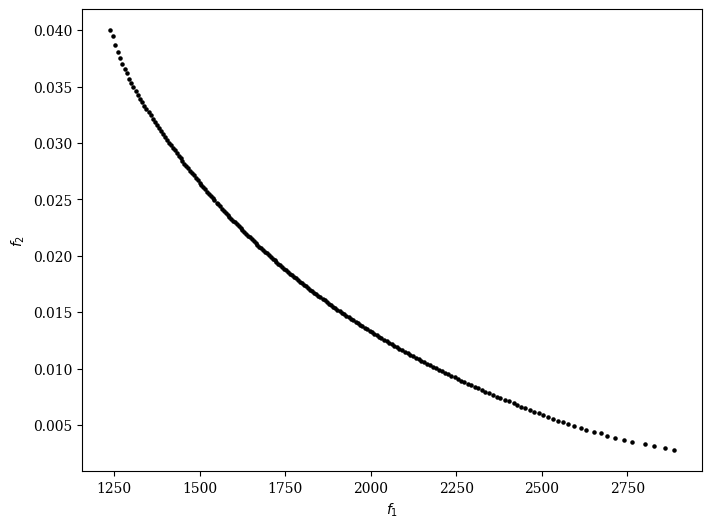

In [ ]:
plot = Scatter()
plot.add(res.F, s=5, facecolors='k', edgecolors='k')
plot.show()

### **$\delta$ = [0.2, 0.3, 0.4]**

In [ ]:
def Truss_obj1(x):
  F = 10; E = 200000; L = 200; S = 10;
  return L*(2*x[:,0] + (2**0.5)*x[:,1] + x[:,2]**0.5 + x[:,3])

def Truss_obj2(x):
  F = 10; E = 200000; L = 200; S = 10;
  return (2*F*L/E)*(1/x[:,0] + (2**0.5)/x[:,1] - (2**0.5)/x[:,2] + 1/x[:,3])

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=4,
                         n_obj=2,
                         n_constr=0,
                         xl=np.array([1, 2**0.5, 2**0.5, 1]),
                         xu=np.array([3, 3, 3, 3]))

    def _evaluate(self, x, out, *args, **kwargs):
        delta = 0.4
        lb = x - [2*delta, 2*delta, delta, 2*delta]
        ub = x + [2*delta, 2*delta, delta, 2*delta]
        sampler = qmc.LatinHypercube(d=4)
        sample = sampler.random(n=50)
        xe = qmc.scale(sample, lb, ub)

        f1 = np.mean(Truss_obj1(xe))
        f2 = np.mean(Truss_obj2(xe))

        out["F"] = [f1, f2]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 2, n_partitions=200)

# create the algorithm object
algorithm = NSGA3(pop_size=201, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=100)
res3 = minimize(problem,
               algorithm,
               ("n_gen", 200),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      201 |     15 |             - |             -
     2 |      402 |     22 |  0.1149301806 |         nadir
     3 |      603 |     28 |  0.0220778247 |             f
     4 |      804 |     31 |  0.0157830831 |             f
     5 |     1005 |     41 |  0.1311402956 |         nadir
     6 |     1206 |     42 |  0.0050057691 |         ideal
     7 |     1407 |     52 |  0.0091163430 |             f
     8 |     1608 |     77 |  0.0407492398 |         ideal
     9 |     1809 |     88 |  0.0145386570 |         ideal
    10 |     2010 |    105 |  0.0065682688 |         nadir
    11 |     2211 |    110 |  0.0057670996 |         nadir
    12 |     2412 |    145 |  0.0097695294 |         ideal
    13 |     2613 |    157 |  0.0011216563 |             f
    14 |     2814 |    161 |  0.0049432208 |         nadir
    15 |     3015 |    166 |  0.0063139922 |         ideal
    16 |     3216 |    165 |  0.0051756777 |         ide

In [ ]:
fa1 = Truss_obj1(res3.X); fa2 = Truss_obj2(res3.X);
fa = [fa1, fa2]
fa = np.transpose(fa)

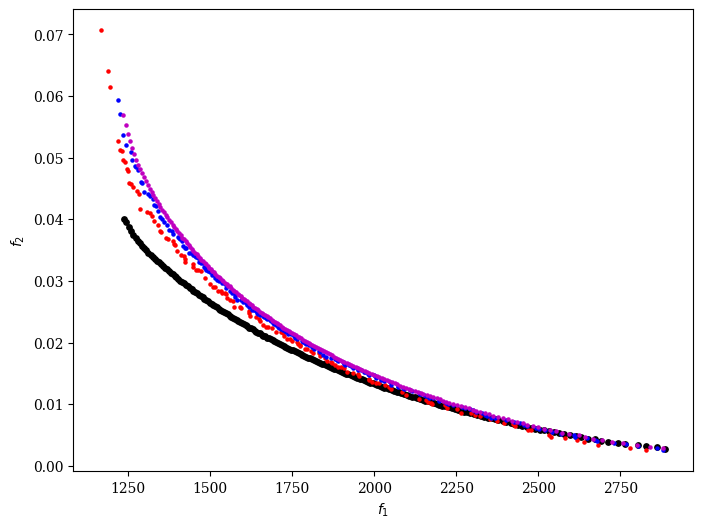

In [ ]:
plot = Scatter()
res1.F = res1.F[res1.F[:,1]<0.15]
res2.F = res2.F[res2.F[:,1]<0.15]
res3.F = res3.F[res3.F[:,1]<0.15]
#fa = fa[fa[:,1]<0.15]
plot.add(res.F,  s=15, facecolors='k', edgecolors='k')
plot.add(res1.F, s=5, facecolors='r', edgecolors='r')
plot.add(res2.F, s=5, facecolors='b', edgecolors='b')
plot.add(res3.F, s=5, facecolors='m', edgecolors='m')
# plot.add(fa, s=5, facecolors='g', edgecolors='g')

plot.show()

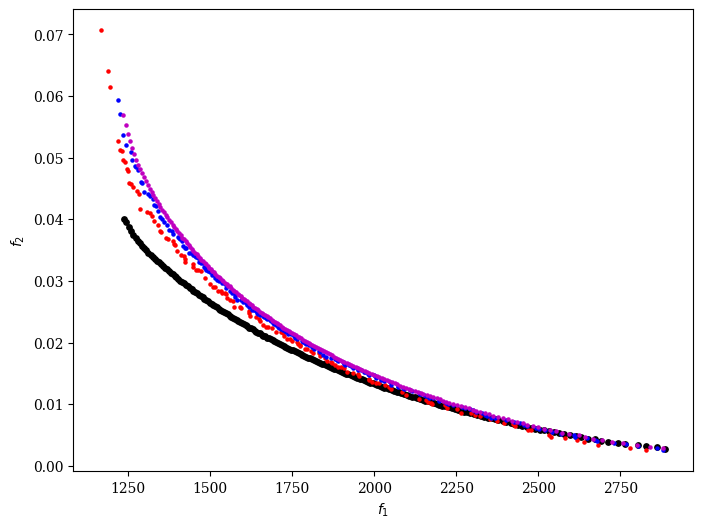

In [ ]:
plot = Scatter()
res1.F = res1.F[res1.F[:,1]<0.15]
res2.F = res2.F[res2.F[:,1]<0.15]
res3.F = res3.F[res3.F[:,1]<0.15]
#fa = fa[fa[:,1]<0.15]
plot.add(res.F,  s=15, facecolors='k', edgecolors='k')
plot.add(res1.F, s=5, facecolors='r', edgecolors='r')
plot.add(res2.F, s=5, facecolors='b', edgecolors='b')
plot.add(res3.F, s=5, facecolors='m', edgecolors='m')
#plot.add(fa, s=5, facecolors='g', edgecolors='g')

plot.show()

In [ ]:
import pandas as pd
import numpy as np
from google.colab import files

Truss_H2 = pd.DataFrame(np.concatenate((res2.F,res2.X),axis=1))

Truss_H2.to_csv("Truss_H2.csv")
files.download("Truss_H2.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

##### For Different $\delta$

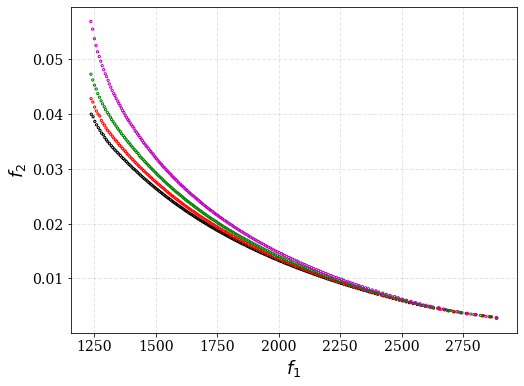

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 6))
plt.rcParams['font.size'] = 14
res1.F = res1.F[res1.F[:,1]<0.15]
res2.F = res2.F[res2.F[:,1]<0.15]
res3.F = res3.F[res3.F[:,1]<0.15]
plt.scatter(res.F[:, 0],  res.F[:, 1],  s=5, facecolors='none', edgecolors='k')
plt.scatter(res1.F[:, 0], res1.F[:, 1], s=5, facecolors='none', edgecolors='r')
plt.scatter(res2.F[:, 0], res2.F[:, 1], s=5, facecolors='none', edgecolors='g')
plt.scatter(res3.F[:, 0], res3.F[:, 1], s=5, facecolors='none', edgecolors='m')

plt.xlabel('$f_1$',fontsize=18)
plt.ylabel('$f_2$',fontsize=18)
#plt.legend(["Original PF","delta = 0.25", "delta = 0.35", "delta = 0.50"], loc ="upper right",fontsize=14) #"Deterministic",   "beta = 3.5",
#plt.title("Carside impact problem: MORBDO",fontsize=20)
plt.grid(color='k', linestyle='--', linewidth=1, alpha=0.1)
plt.show()

##### For Different $H$ = [5,10,50] at $\delta$ = 0.40

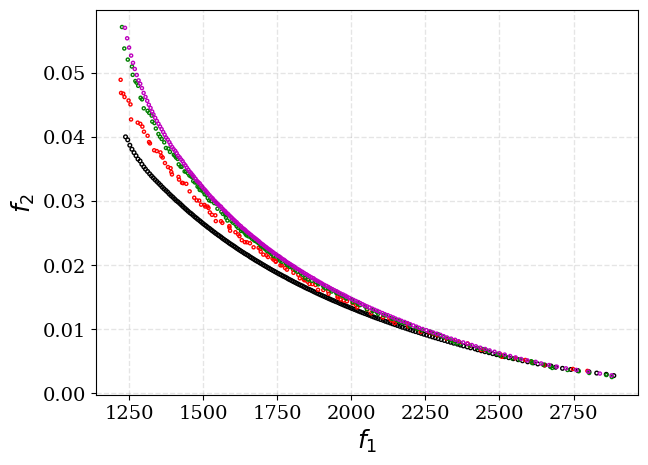

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
plt.figure(figsize=(7, 5))
plt.rcParams['font.size'] = 14
res1.F = res1.F[res1.F[:,1]<0.06] #+ [-20, 0.002]
res2.F = res2.F[res2.F[:,1]<0.06] + [0, 0]
res3.F = res3.F[res3.F[:,1]<0.06]+ [0, 0]
plt.scatter(res.F[:, 0],  res.F[:, 1],  s=7, facecolors='none', edgecolors='k')
plt.scatter(res1.F[:, 0], res1.F[:, 1], s=5, facecolors='none', edgecolors='r')
plt.scatter(res2.F[:, 0], res2.F[:, 1], s=5, facecolors='none', edgecolors='g')
plt.scatter(res3.F[:, 0], res3.F[:, 1], s=5, facecolors='none', edgecolors='m')

plt.xlabel('$f_1$',fontsize=18)
plt.ylabel('$f_2$',fontsize=18)
#plt.legend(["Original PF","delta = 0.25", "delta = 0.35", "delta = 0.50"], loc ="upper right",fontsize=14) # "Deterministic",   "beta = 3.5",
#plt.title("Carside impact problem: MORBDO",fontsize=20)
plt.grid(color='k', linestyle='--', linewidth=1, alpha=0.1)
plt.show()

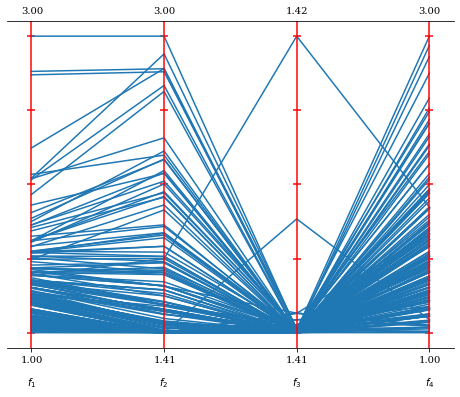

In [ ]:
from pymoo.visualization.pcp import PCP
PCP().add(res3.X).show()

In [ ]:
min(res.F[:,1])


0.002765899294661747

## 4 bar truss problem: Type II Robustness

### **$\delta$ = 0.25; $\eta$ = [1e-4, 1.25e-4, 1.5e-4, 1.75e-4]**

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=4,
                         n_obj=2,
                         n_constr=1,
                         xl=np.array([1, 2**0.5, 2**0.5, 1]),
                         xu=np.array([3, 3, 3, 3]))

    def _evaluate(self, x, out, *args, **kwargs):
        F = 10; E = 200000; L = 200; S = 10; a = F/S;
        f1 = L*(2*x[0]+ (2**0.5)*x[1] + x[2]**0.5 + x[3])
        f2 = (2*F*L/E)*(1/x[0] + (2**0.5)/x[1] - (2**0.5)/x[2] +1/x[3])

        delta = 0.25
        lb = x - [2*delta, 2*delta, delta, 2*delta]
        ub = x + [2*delta, 2*delta, delta, 2*delta]
        sampler = qmc.LatinHypercube(d=4)
        sample = sampler.random(n=500)
        xe = qmc.scale(sample, lb, ub)

        f1_e = np.mean(Truss_obj1(xe))
        f2_e = np.mean(Truss_obj2(xe))

        g1 = np.linalg.norm(np.array([f1,f2])-np.array([f1_e,f2_e]))/np.linalg.norm(np.array([f1,f2])) -  0.000175
        out["F"] = [f1, f2]
        out["G"] = [g1]
problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 2, n_partitions=200)

# create the algorithm object
algorithm = NSGA3(pop_size=201, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=201)
res4 = minimize(problem,
               algorithm,
               ("n_gen", 200),
               verbose=True,
               seed=1)

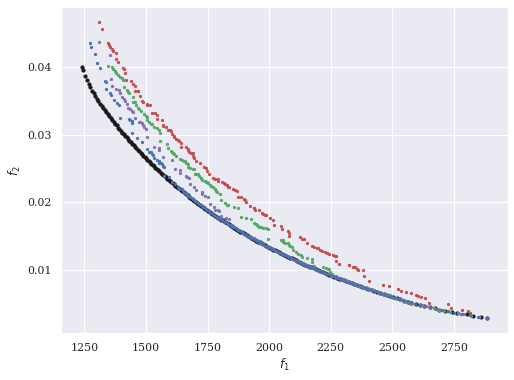

In [ ]:
plot = Scatter()
#res1.F = res1.F[res1.F[:,1]<0.1]
plot.add(res.F, s=10, facecolors='k', edgecolors='k')
plot.add(res1.F, s=5, facecolors='r', edgecolors='r')
plot.add(res2.F, s=5, facecolors='g', edgecolors='g')
plot.add(res3.F, s=5, facecolors='m', edgecolors='m')
plot.add(res4.F, s=5, facecolors='b', edgecolors='b')
plot.show()

In [ ]:
import pandas as pd
import numpy as np
from google.colab import files

Truss_eta4 = pd.DataFrame(np.concatenate((res4.F,res4.X),axis=1))

Truss_eta4.to_csv("Truss_eta4.csv")
files.download("Truss_eta4.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

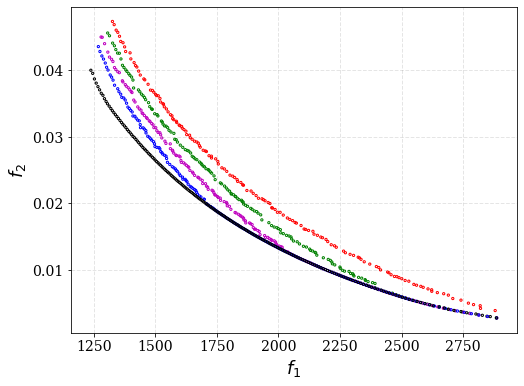

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 6))
plt.rcParams['font.size'] = 14

plt.scatter(res1.F[:, 0], res1.F[:, 1], s=5, facecolors='none', edgecolors='r')
plt.scatter(res2.F[:, 0], res2.F[:, 1], s=5, facecolors='none', edgecolors='g')
plt.scatter(res3.F[:, 0], res3.F[:, 1], s=5, facecolors='none', edgecolors='m')
plt.scatter(res4.F[:, 0], res4.F[:, 1], s=5, facecolors='none', edgecolors='b')
plt.scatter(res.F[:, 0],  res.F[:, 1],  s=5, facecolors='none', edgecolors='k')

plt.xlabel('$f_1$',fontsize=18)
plt.ylabel('$f_2$',fontsize=18)
#plt.legend(["Original PF","delta = 0.25", "delta = 0.35", "delta = 0.50"], loc ="upper right",fontsize=14) #"Deterministic",   "beta = 3.5",
#plt.title("Carside impact problem: MORBDO",fontsize=20)
plt.grid(color='k', linestyle='--', linewidth=1, alpha=0.1)
plt.show()

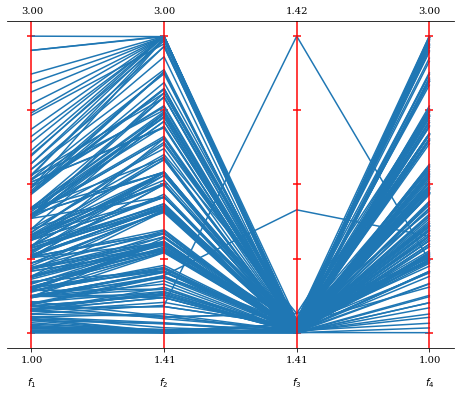

In [ ]:
from pymoo.visualization.pcp import PCP
PCP().add(res1.X).show()

## Hypervolume Calculation

In [ ]:
from google.colab import files
uploaded = files.upload()


Saving Truss_eta4.csv to Truss_eta4 (1).csv


In [ ]:
import io
import pandas as pd
df = pd.read_csv(io.BytesIO(uploaded['Truss_eta4.csv']))
df.head()


,Unnamed: 0,0,1,2,3,4,5
0,0,1858.619796,0.016238,1.580662,2.047713,1.414246,2.046652
1,1,1846.364300,0.016487,1.468842,2.045860,1.414356,2.211588
2,2,2481.411856,0.006133,2.078281,2.898963,1.414226,2.961532
3,3,1512.849664,0.027427,1.142899,1.693161,1.501607,1.658558
4,4,2355.943694,0.007719,1.983902,2.847904,1.414214,2.595163


In [ ]:
A = np.array(df[['0','1']].values.tolist())


In [ ]:
from pymoo.indicators.hv import HV

ref_point = np.array([3000, 0.055])

ind = HV(ref_point=ref_point)
print("HV", ind(A))

HV 70.67817527988187


## Water Management Problem

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=2,
                         n_obj=5,
                         n_constr=0,
                         xl=np.array([0.3, 0.3]),
                         xu=np.array([1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):

        f1 = -(4.07 + 2.27 * x[0]);
        f2 = -(2.60 + 0.03*x[0] + 0.02*x[1] + 0.01 / (1.39 - x[0]**2) + 0.30 / (1.39 - x[1]**2))
        f3 = -(8.21 - 0.71 / (1.09 - x[0]**2))
        f4 = -(0.96 - 0.96 / (1.09 - x[1]**2))
        f5 = np.max([abs(x[0] - 0.65), abs(x[1] - 0.65)])

        out["F"] = [f1, f2, f3, f4, f5]
        #out["G"] = [g1]

problem = MyProblem()

In [ ]:
ref_dirs = get_reference_directions("das-dennis", 5, n_partitions=20)

# create the algorithm object
algorithm = NSGA3(pop_size=11000, ref_dirs=ref_dirs)
# algorithm = NSGA2(pop_size=250)

res = minimize(problem,
               algorithm,
               ("n_gen", 20),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |    11000 |    227 |             - |             -
     2 |    22000 |    237 |  0.0109413949 |         ideal
     3 |    33000 |    235 |  0.0140080250 |         ideal
     4 |    44000 |    239 |  0.0061223812 |         nadir
     5 |    55000 |    238 |  0.0067052282 |         ideal
     6 |    66000 |    239 |  0.0111203943 |         ideal
     7 |    77000 |    240 |  0.0025005701 |             f
     8 |    88000 |    241 |  0.0029467069 |             f
     9 |    99000 |    238 |  0.0081448741 |         ideal
    10 |   110000 |    240 |  0.0019837200 |             f
    11 |   121000 |    242 |  0.0029362211 |             f
    12 |   132000 |    242 |  0.0012759149 |             f
    13 |   143000 |    243 |  0.0018911402 |             f
    14 |   154000 |    244 |  0.0021017039 |             f
    15 |   165000 |    242 |  0.0023294734 |             f
    16 |   176000 |    240 |  0.0025049922 |         ide

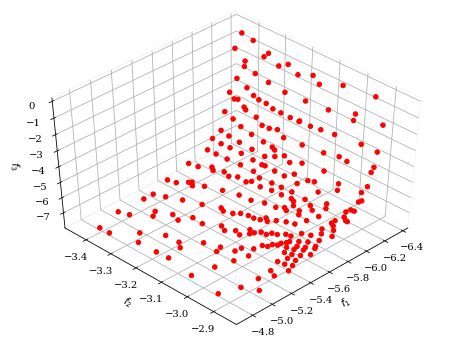

In [ ]:
plot = Scatter()
plot.add(res.F[:,0:3], color="red")
plot.show()

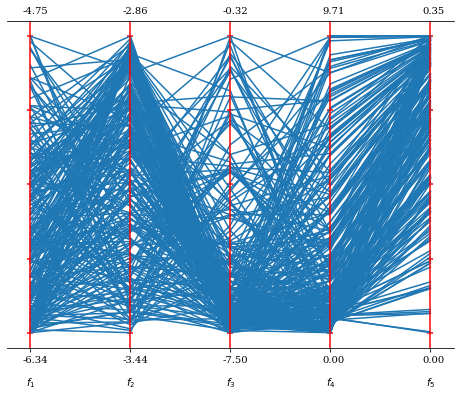

In [ ]:
from pymoo.visualization.pcp import PCP
PCP().add(res.F).show()

## Type I Robustness

### **$\delta$ = [0.010, 0.025, 0.035]; $H$ = [2, 5, 100]**

In [ ]:
def Water_obj1(x):
  return -(4.07 + 2.27 * x[:,0])

def Water_obj2(x):
  return -(2.60 + 0.03*x[:,0] + 0.02*x[:,1] + 0.01 / (1.39 - x[:,0]**2) + 0.30 / (1.39 - x[:,1]**2))

def Water_obj3(x):
  return -(8.21 - 0.71 / (1.09 - x[:,0]**2))

def Water_obj4(x):
  return -(0.96 - 0.96 / (1.09 - x[:,1]**2))

def Water_obj5(x):
  return np.max([abs(x[:,0] - 0.65), abs(x[:,1] - 0.65)])

In [ ]:
x = np.array([[2,3],[1,5]])
Water_obj5(x)

4.35

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=2,
                         n_obj=5,
                         n_constr=0,
                         xl=np.array([0.3, 0.3]),
                         xu=np.array([1.0, 1.0]))

    def _evaluate(self, x, out, *args, **kwargs):
        delta = 0.035
        lb = x - [delta, delta]
        ub = x + [delta, delta]
        sampler = qmc.LatinHypercube(d=2)
        sample = sampler.random(n=5)
        xe = qmc.scale(sample, lb, ub)

        f1 = np.mean(Water_obj1(xe))
        f2 = np.mean(Water_obj2(xe))
        f3 = np.mean(Water_obj3(xe))
        f4 = np.mean(Water_obj4(xe))
        f5 = np.mean(Water_obj5(xe))

        out["F"] = [f1, f2, f3, f4, f5]

problem = MyProblem()

In [ ]:
ref_dirs = get_reference_directions("das-dennis", 5, n_partitions=20)

# create the algorithm object
algorithm = NSGA3(pop_size=11000, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=1000)

res2 = minimize(problem,
               algorithm,
               ("n_gen", 10),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |    11000 |    244 |             - |             -
     2 |    22000 |    269 |  0.0044811838 |         ideal
     3 |    33000 |    286 |  0.0027962635 |         ideal
     4 |    44000 |    290 |  0.0061786647 |         ideal
     5 |    55000 |    293 |  0.0160858402 |         ideal
     6 |    66000 |    290 |  0.0086466630 |         ideal
     7 |    77000 |    292 |  0.0220231034 |         ideal
     8 |    88000 |    296 |  0.0050913023 |         ideal
     9 |    99000 |    297 |  0.0033086663 |         ideal
    10 |   110000 |    293 |  0.0060518438 |         ideal


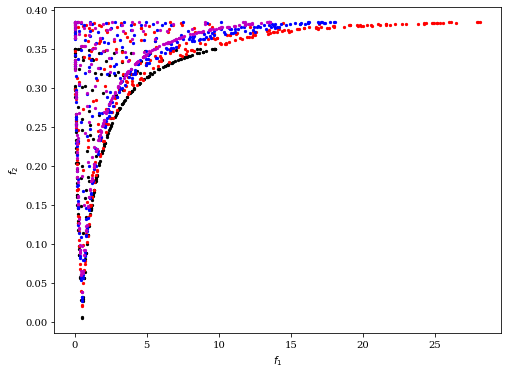

In [ ]:
plot = Scatter()
#res1.F = res1.F[res1.F[:,1]<0.15]
plot.add(res.F[:,[3,4]],  s=5, facecolors='k', edgecolors='k')
plot.add(res1.F[:,[3,4]], s=5, facecolors='r', edgecolors='r')
plot.add(res2.F[:,[3,4]], s=5, facecolors='b', edgecolors='b')
plot.add(res3.F[:,[3,4]], s=5, facecolors='m', edgecolors='m')
plot.show()

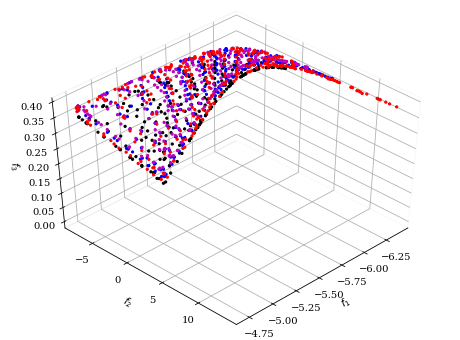

In [ ]:
plot = Scatter()

plot.add(res.F[:,[0,2,4]],  s=5, facecolors='k', edgecolors='k')
plot.add(res1.F[:,[0,2,4]], s=5, facecolors='r', edgecolors='r')
plot.add(res2.F[:,[0,2,4]], s=5, facecolors='b', edgecolors='b')
plot.add(res3.F[:,[0,2,4]], s=5, facecolors='m', edgecolors='m')
plot.show()

In [ ]:
import pandas as pd
import numpy as np
from google.colab import files
water = pd.DataFrame(np.concatenate((res.F,res.X),axis=1))

water.to_csv("water_del3.csv")
files.download("water_del3.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import pandas as pd
import numpy as np
from google.colab import files
water = pd.DataFrame(np.concatenate((res3.F,res3.X),axis=1))

water.to_csv("water_H100.csv")
files.download("water_H100.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Type II Robustness

### **$\delta$ = 0.025; $\eta$ = [0.005, 0.01, 0.025]**

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=2,
                         n_obj=5,
                         n_constr=1,
                         xl=np.array([0.3, 0.3]),
                         xu=np.array([1, 1]))

    def _evaluate(self, x, out, *args, **kwargs):
        f1 = -(4.07 + 2.27 * x[0]);
        f2 = -(2.60 + 0.03*x[0] + 0.02*x[1] + 0.01 / (1.39 - x[0]**2) + 0.30 / (1.39 - x[1]**2))
        f3 = -(8.21 - 0.71 / (1.09 - x[0]**2))
        f4 = -(0.96 - 0.96 / (1.09 - x[1]**2))
        f5 = np.max([abs(x[0] - 0.65), abs(x[1] - 0.65)])

        delta = 0.025
        lb = x - [delta, delta]
        ub = x + [delta, delta]
        sampler = qmc.LatinHypercube(d=2)
        sample = sampler.random(n=100)
        xe = qmc.scale(sample, lb, ub)

        f1_e = np.mean(Water_obj1(xe))
        f2_e = np.mean(Water_obj2(xe))
        f3_e = np.mean(Water_obj3(xe))
        f4_e = np.mean(Water_obj4(xe))
        f5_e = np.mean(Water_obj5(xe))

        g1 = np.linalg.norm(np.array([f1,f2,f3,f4,f5])-np.array([f1_e,f2_e,f3_e,f4_e,f5_e]))/np.linalg.norm(np.array([f1,f2,f3,f4,f5])) -  0.01
        out["F"] = [f1, f2, f3, f4, f5]
        out["G"] = [g1]

problem = MyProblem()

In [ ]:
ref_dirs = get_reference_directions("das-dennis", 5, n_partitions=20)

# create the algorithm object
algorithm = NSGA3(pop_size=11000, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=1000)

res3 = minimize(problem,
               algorithm,
               ("n_gen", 10),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |     cv_min    |     cv_avg    |      eps      |   indicator  
     1 |    11000 |    239 |  0.000000E+00 |  0.0041877102 |             - |             -
     2 |    22000 |    244 |  0.000000E+00 |  0.000000E+00 |  0.0071888139 |         ideal
     3 |    33000 |    248 |  0.000000E+00 |  0.000000E+00 |  0.0030441610 |         nadir
     4 |    44000 |    250 |  0.000000E+00 |  0.000000E+00 |  0.0054628564 |         ideal
     5 |    55000 |    256 |  0.000000E+00 |  0.000000E+00 |  0.0086494543 |         ideal
     6 |    66000 |    253 |  0.000000E+00 |  0.000000E+00 |  0.0037987444 |             f
     7 |    77000 |    253 |  0.000000E+00 |  0.000000E+00 |  0.0052394970 |         ideal
     8 |    88000 |    254 |  0.000000E+00 |  0.000000E+00 |  0.0020386681 |             f
     9 |    99000 |    253 |  0.000000E+00 |  0.000000E+00 |  0.0029040820 |         nadir
    10 |   110000 |    253 |  0.000000E+00 |  0.000000E+00 |  0.0015801036 |             f

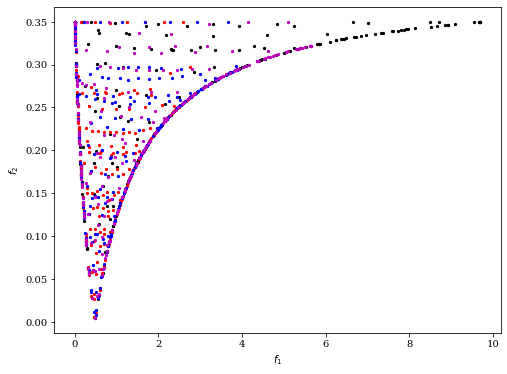

In [ ]:
plot = Scatter()
#res1.F = res1.F[res1.F[:,1]<0.15]
plot.add(res.F[:,[3,4]],  s=5, facecolors='k', edgecolors='k')
plot.add(res1.F[:,[3,4]], s=5, facecolors='r', edgecolors='r')
plot.add(res2.F[:,[3,4]], s=5, facecolors='b', edgecolors='b')
plot.add(res3.F[:,[3,4]], s=5, facecolors='m', edgecolors='m')
plot.show()

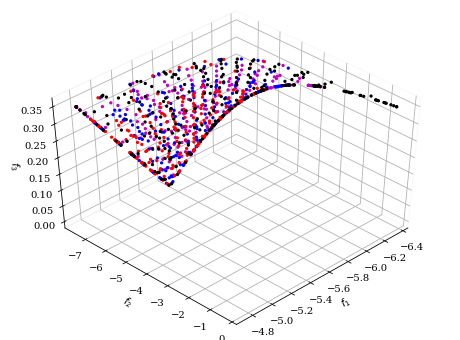

In [ ]:
plot = Scatter()

plot.add(res.F[:,[0,2,4]],  s=5, facecolors='k', edgecolors='k')
plot.add(res1.F[:,[0,2,4]], s=5, facecolors='r', edgecolors='r')
plot.add(res2.F[:,[0,2,4]], s=5, facecolors='b', edgecolors='b')
plot.add(res3.F[:,[0,2,4]], s=5, facecolors='m', edgecolors='m')
plot.show()

In [ ]:
import pandas as pd
import numpy as np
from google.colab import files
water = pd.DataFrame(np.concatenate((res3.F,res3.X),axis=1))

water.to_csv("water_eta3.csv")
files.download("water_eta3.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### **RNSGA-III based MCDM**

In [ ]:
ref_points = np.array([[-6.0, -3.4, 0.0, 10, 0.5]]) #

algorithm = RNSGA3(
    ref_points=ref_points,
    pop_per_ref_point=70,
    mu=0.05)

res_RNSGAIII = minimize(problem,
               algorithm=algorithm,
               termination=('n_gen', 2000),
               extreme_points_as_reference_points=True,
               seed=1,
               verbose=False)

In [ ]:
res_RNSGAIII.F

array([[-6.18713935, -3.24427577, -4.98484389,  3.43016016,  0.28345014],
       [-5.66710975, -2.93706169, -7.01669387,  0.36422968,  0.05357258],
       [-5.56959737, -3.00245582, -7.12368717,  0.81909444,  0.09188924],
       [-5.75638732, -3.08724765, -6.89053471,  1.51645168,  0.1880624 ]])

<Figure size 864x720 with 0 Axes>

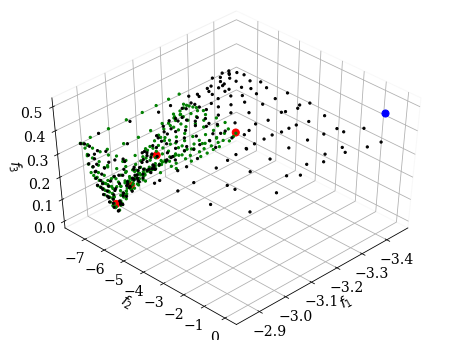

In [ ]:
plot = Scatter()
import matplotlib
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 10))
plt.rcParams['font.size'] = 14
#res1.F = res1.F[res1.F[:,1]<0.15]
plot.add(res.F[:,[1,2,4]],  s=5, facecolors='k', edgecolors='k')
plot.add(res3.F[:,[1,2,4]], s=5, facecolors='g', edgecolors='g')
plot.add(res_RNSGAIII.F[:,[1,2,4]], s=50, facecolors='r', edgecolors='r')
plot.add(ref_points[:,[1,2,4]], s=50, facecolors='b', edgecolors='b')
plot.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="ticks")
df1 = df[['F1','F2','F3','F4','F5','Category']]
sns.pairplot(df1, diag_kind = "None", hue="Category", palette="bright", corner="True")

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving water_del.xlsx to water_del.xlsx


In [ ]:
import io
import pandas as pd
df = pd.read_excel(io.BytesIO(uploaded['water_del.xlsx']))
df.head()

,F1,F2,F3,F4,F5,X1,X2,Category
0,-4.920843,-2.903025,-7.462246,0.241574,0.275179,0.374821,0.539489,0.0
1,-5.997897,-2.969443,-6.284316,0.516622,0.199294,0.849294,0.663225,0.0
2,-6.328705,-3.127294,-1.104796,1.715198,0.345024,0.995024,0.855072,0.0
3,-5.681100,-2.949955,-6.998964,0.441987,0.059736,0.709736,0.636598,0.0
4,-6.303985,-3.166699,-2.365390,2.185818,0.334134,0.984134,0.885908,0.0


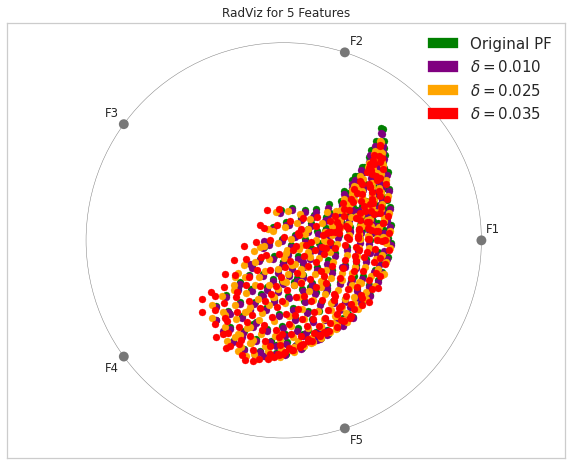

In [ ]:
from yellowbrick.features import RadViz
import matplotlib.pyplot as plt
import matplotlib
from yellowbrick.style.palettes import PALETTES, SEQUENCES, color_palette

# Load the classification dataset
X = df[['F1','F2','F3','F4','F5']]
y = df['Category']

classes = ["Original PF","$\delta = 0.010$", "$\delta = 0.025$", "$\delta = 0.035$"]

# Instantiate the visualizer
fig, axes = plt.subplots(figsize=(10,8))
visualizer = RadViz(classes=classes, colors = {'purple','orange','green','red'}, alpha = 1.0)

visualizer.fit(X, y)           # Fit the data to the visualizer
visualizer.transform(X)        # Transform the data

matplotlib.rc('font', size=14)
matplotlib.rc('legend', fontsize=15)
visualizer.show()              # Finalize and render the figure

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving water_eta.xlsx to water_eta (1).xlsx


In [ ]:
import io
import pandas as pd
df = pd.read_excel(io.BytesIO(uploaded['water_eta.xlsx']))
df.head()

,F1,F2,F3,F4,F5,X1,X2,Category
0,-4.920843,-2.903025,-7.462246,0.241574,0.275179,0.374821,0.539489,0
1,-5.997897,-2.969443,-6.284316,0.516622,0.199294,0.849294,0.663225,0
2,-6.328705,-3.127294,-1.104796,1.715198,0.345024,0.995024,0.855072,0
3,-5.681100,-2.949955,-6.998964,0.441987,0.059736,0.709736,0.636598,0
4,-6.303985,-3.166699,-2.365390,2.185818,0.334134,0.984134,0.885908,0


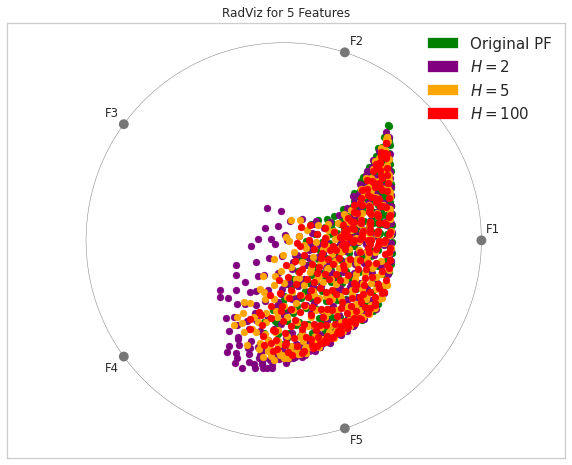

In [ ]:
from yellowbrick.features import RadViz
import matplotlib.pyplot as plt
import matplotlib
from yellowbrick.style.palettes import PALETTES, SEQUENCES, color_palette

# Load the classification dataset
X = df[['F1','F2','F3','F4','F5']]
y = df['Category']

classes = ["Original PF","$H = 2$", "$H = 5$", "$H = 100$"]

# Instantiate the visualizer
fig, axes = plt.subplots(figsize=(10,8))
visualizer = RadViz(classes=classes, colors = {'purple','orange','green','red'}, alpha = 1.0)

visualizer.fit(X, y)           # Fit the data to the visualizer
visualizer.transform(X)        # Transform the data

matplotlib.rc('font', size=14)
matplotlib.rc('legend', fontsize=15)
visualizer.show()              # Finalize and render the figure

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving water_del.xlsx to water_del (2).xlsx


In [ ]:
import io
import pandas as pd
df = pd.read_excel(io.BytesIO(uploaded['water_del.xlsx']))
df.head()

,F1,F2,F3,F4,F5,X1,X2,Category
0,-4.920843,-2.903025,-7.462246,0.241574,0.275179,0.374821,0.539489,0.0
1,-5.997897,-2.969443,-6.284316,0.516622,0.199294,0.849294,0.663225,0.0
2,-6.328705,-3.127294,-1.104796,1.715198,0.345024,0.995024,0.855072,0.0
3,-5.681100,-2.949955,-6.998964,0.441987,0.059736,0.709736,0.636598,0.0
4,-6.303985,-3.166699,-2.365390,2.185818,0.334134,0.984134,0.885908,0.0


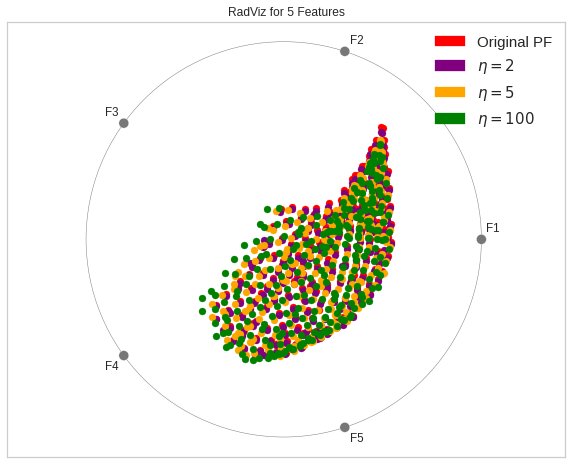

In [ ]:
from yellowbrick.features import RadViz
import matplotlib.pyplot as plt
import matplotlib
from yellowbrick.style.palettes import PALETTES, SEQUENCES, color_palette

# Load the classification dataset
X = df[['F1','F2','F3','F4','F5']]
y = df['Category']

classes = ["Original PF","$\eta = 2$", "$\eta = 5$", "$\eta = 100$"]

# Instantiate the visualizer
fig, axes = plt.subplots(figsize=(10,8))
visualizer = RadViz(classes=classes, colors = {'purple','orange','green','red'}, alpha = 1.0)

visualizer.fit(X, y)           # Fit the data to the visualizer
visualizer.transform(X)        # Transform the data

matplotlib.rc('font', size=14)
matplotlib.rc('legend', fontsize=15)
visualizer.show()              # Finalize and render the figure

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving water_eta.xlsx to water_eta.xlsx


In [ ]:
import io
import pandas as pd
df = pd.read_excel(io.BytesIO(uploaded['water_eta.xlsx']))
df.head()

,F1,F2,F3,F4,F5,X1,X2,Category
0,-4.920843,-2.903025,-7.462246,0.241574,0.275179,0.374821,0.539489,0.0
1,-5.997897,-2.969443,-6.284316,0.516622,0.199294,0.849294,0.663225,0.0
2,-6.328705,-3.127294,-1.104796,1.715198,0.345024,0.995024,0.855072,0.0
3,-5.681100,-2.949955,-6.998964,0.441987,0.059736,0.709736,0.636598,0.0
4,-6.303985,-3.166699,-2.365390,2.185818,0.334134,0.984134,0.885908,0.0


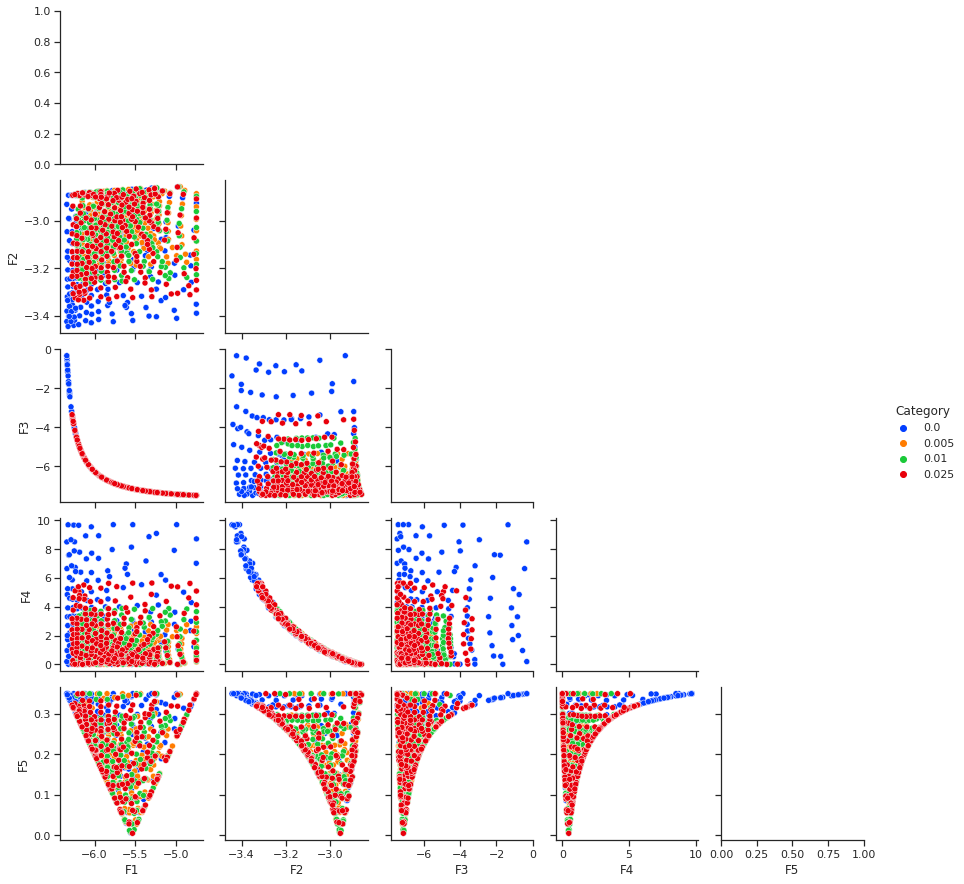

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="ticks")
df1 = df[['F1','F2','F3','F4','F5','Category']]
sns.pairplot(df1, diag_kind = "None", hue="Category", palette="bright", corner="True")

## **Hyper Volume Calculation**

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving water_eta3.csv to water_eta3.csv


In [ ]:
import io
import pandas as pd
df = pd.read_csv(io.BytesIO(uploaded['water_eta3.csv']))
df.head()

,Unnamed: 0,0,1,2,3,4,5,6
0,0,-5.851174,-3.114248,-6.713094,1.772564,0.209466,0.784658,0.859466
1,1,-5.491191,-2.917799,-7.192852,0.271251,0.092949,0.626075,0.557051
2,2,-5.727397,-3.318235,-6.935105,5.400227,0.319052,0.730131,0.969052
3,3,-5.922392,-3.319245,-6.535835,5.296214,0.317756,0.816032,0.967756
4,4,-5.481033,-3.170296,-7.200922,2.557125,0.253908,0.621600,0.903908


In [ ]:
A = np.array(df[['0','1','2','3','4']].values.tolist())
#A

In [ ]:
from pymoo.indicators.hv import HV

ref_point = np.array([-4.5, -2.5, 16, 31, 0.45])

ind = HV(ref_point=ref_point)
print("HV", ind(A))

HV 316.32845595117703


In [ ]:
ref_point = np.zeros(5)
for i in range(0,5):
  ref_point[i] = max(A[:,i]) + 0.1*(max(A[:,i]) - min(A[:,i]))
ref_point

# 6-Objective function

In [ ]:
import numpy as np
from pymoo.algorithms.moo.nsga2 import NSGA2
from pymoo.core.problem import ElementwiseProblem
from pymoo.optimize import minimize
from pymoo.visualization.scatter import Scatter

class MyProblem(ElementwiseProblem):


    def __init__(self):
        super().__init__(n_var=2,
                         n_obj=6,
                         n_constr=0,
                         xl=np.array([1, 1]),
                         xu=np.array([3, 3]))

    def _evaluate(self, x, out, *args, **kwargs):
      x1 = x[0]; x2 = x[1];

      f1 = x1*x2
      f2 = (x1-4)**2 + x2**2
      f3 = -x1-x2
      f4 = x1-x2
      f5 = 50*x1**4 + 10*x2**4
      f6 = 30*(x1-5)**4 + 100*(x2-3)**4

      out["F"] = [f1, f2, f3, f4, f5, f6]

problem = MyProblem()

In [ ]:
ref_dirs = get_reference_directions("das-dennis", 6, n_partitions=15)

# create the algorithm object
# algorithm = NSGA3(pop_size=15600, ref_dirs=ref_dirs)
algorithm = NSGA2(pop_size=1000)

res = minimize(problem,
               algorithm,
               ("n_gen", 10),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |     1000 |   1000 |             - |             -
     2 |     2000 |   1000 |  0.0315480861 |         ideal
     3 |     3000 |   1000 |  0.0113980125 |         ideal
     4 |     4000 |   1000 |  0.0028183024 |         ideal
     5 |     5000 |   1000 |  0.0066111877 |             f
     6 |     6000 |   1000 |  0.0040876692 |         nadir
     7 |     7000 |   1000 |  0.0065259965 |             f
     8 |     8000 |   1000 |  0.0068376639 |             f
     9 |     9000 |   1000 |  0.0062577852 |             f
    10 |    10000 |   1000 |  0.0058676872 |             f


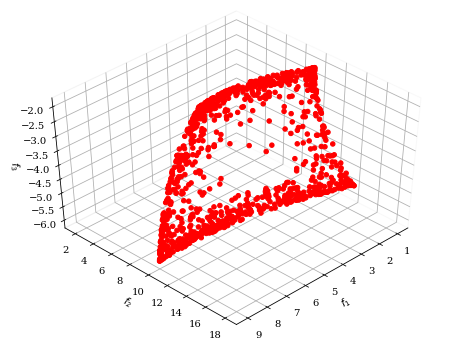

In [ ]:
plot = Scatter()
plot.add(res.F[:,0:3], color="red")
plot.show()

## Type I Robustness

### **$\delta$ = [0.8, 0.95]**

In [ ]:
def NIM_obj1(x):
  return x[:,0]*x[:,1]

def NIM_obj2(x):
  return (x[:,0]-4)**2 + x[:,1]**2

def NIM_obj3(x):
  return -x[:,0]-x[:,1]

def NIM_obj4(x):
  return x[:,0]-x[:,1]

def NIM_obj5(x):
  return 50*x[:,0]**4 + 10*x[:,1]**4

def NIM_obj6(x):
  return 30*(x[:,0]-5)**4 + 100*(x[:,1]-3)**4


In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=2,
                         n_obj=6,
                         n_constr=0,
                         xl=np.array([1, 1]),
                         xu=np.array([3, 3]))

    def _evaluate(self, x, out, *args, **kwargs):
        delta = 0.5
        lb = x - [delta, delta]
        ub = x + [delta, delta]
        sampler = qmc.LatinHypercube(d=2)
        sample = sampler.random(n=500)
        xe = qmc.scale(sample, lb, ub)

        f1 = np.mean(NIM_obj1(xe))
        f2 = np.mean(NIM_obj2(xe))
        f3 = np.mean(NIM_obj3(xe))
        f4 = np.mean(NIM_obj4(xe))
        f5 = np.mean(NIM_obj5(xe))
        f6 = np.mean(NIM_obj6(xe))

        out["F"] = [f1, f2, f3, f4, f5, f6]

problem = MyProblem()

In [ ]:
ref_dirs = get_reference_directions("das-dennis", 6, n_partitions=15)

# create the algorithm object
# algorithm = NSGA3(pop_size=15600, ref_dirs=ref_dirs)
algorithm = NSGA2(pop_size=1000)

res3 = minimize(problem,
               algorithm,
               ("n_gen", 10),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |     1000 |   1000 |             - |             -
     2 |     2000 |   1000 |  0.0315437388 |         ideal
     3 |     3000 |   1000 |  0.0040960057 |         ideal
     4 |     4000 |   1000 |  0.0060449194 |         ideal
     5 |     5000 |   1000 |  0.0069419724 |         nadir
     6 |     6000 |   1000 |  0.0027718771 |         nadir
     7 |     7000 |   1000 |  0.0065289998 |             f
     8 |     8000 |   1000 |  0.0071674200 |             f
     9 |     9000 |   1000 |  0.0063864219 |             f
    10 |    10000 |   1000 |  0.0032133805 |         nadir


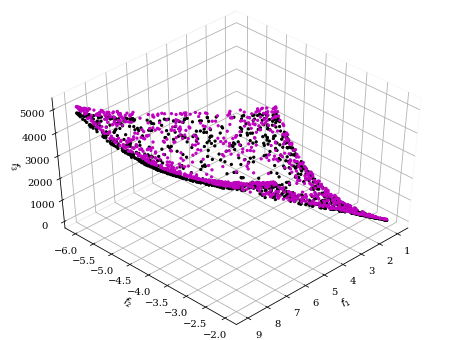

In [ ]:
plot = Scatter()
plot.add(res.F[:,[0,2,4]],  s=5, facecolors='k', edgecolors='k')
#plot.add(res1.F[:,[0,2,4]], s=5, facecolors='r', edgecolors='r')
#plot.add(res2.F[:,[0,2,4]], s=5, facecolors='b', edgecolors='b')
plot.add(res3.F[:,[0,2,4]], s=5, facecolors='m', edgecolors='m')
plot.show()

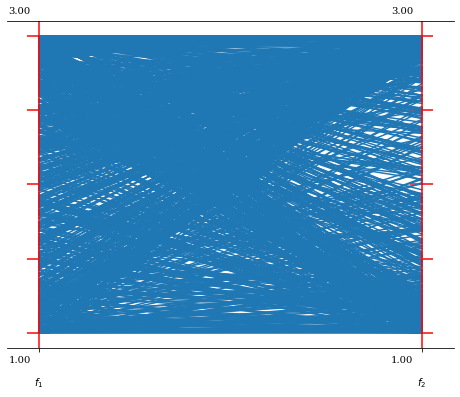

In [ ]:
from pymoo.visualization.pcp import PCP
PCP().add(res.X).show()

## Type II robustness

### **$\eta$ = [0.008, 0.009, 0.01, 0.012]**

In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=2,
                         n_obj=6,
                         n_constr=1,
                         xl=np.array([1, 1]),
                         xu=np.array([3, 3]))

    def _evaluate(self, x, out, *args, **kwargs):
      x1 = x[0]; x2 = x[1];

      f1 = x1*x2
      f2 = (x1-4)**2 + x2**2
      f3 = -x1-x2
      f4 = x1-x2
      f5 = 50*x1**4 + 10*x2**4
      f6 = 30*(x1-5)**4 + 100*(x2-3)**4

      delta = 0.25
      lb = x - [delta, delta]
      ub = x + [delta, delta]
      sampler = qmc.LatinHypercube(d=2)
      sample = sampler.random(n=100)
      xe = qmc.scale(sample, lb, ub)

      f1_e = np.mean(NIM_obj1(xe))
      f2_e = np.mean(NIM_obj2(xe))
      f3_e = np.mean(NIM_obj3(xe))
      f4_e = np.mean(NIM_obj4(xe))
      f5_e = np.mean(NIM_obj5(xe))
      f6_e = np.mean(NIM_obj6(xe))

      g1 = np.linalg.norm(np.array([f1,f2,f3,f4,f5,f6])-np.array([f1_e,f2_e,f3_e,f4_e,f5_e,f6_e]))/np.linalg.norm(np.array([f1,f2,f3,f4,f5,f6])) -  0.012
      out["F"] = [f1, f2, f3, f4, f5,f6]
      out["G"] = [g1]

problem = MyProblem()

In [ ]:
ref_dirs = get_reference_directions("das-dennis", 6, n_partitions=15)

# create the algorithm object
algorithm = NSGA3(pop_size=15600, ref_dirs=ref_dirs)
algorithm = NSGA2(pop_size=500)

res4 = minimize(problem,
               algorithm,
               ("n_gen", 100),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |     cv_min    |     cv_avg    |      eps      |   indicator  
     1 |      500 |     81 |  0.000000E+00 |  0.0058648164 |             - |             -
     2 |     1000 |    227 |  0.000000E+00 |  0.0010019038 |  0.0625222595 |         ideal
     3 |     1500 |    500 |  0.000000E+00 |  0.000000E+00 |  0.0203292696 |         ideal
     4 |     2000 |    500 |  0.000000E+00 |  0.000000E+00 |  0.0186333943 |         ideal
     5 |     2500 |    500 |  0.000000E+00 |  0.000000E+00 |  0.0194537475 |         ideal
     6 |     3000 |    500 |  0.000000E+00 |  0.000000E+00 |  0.0064366493 |         ideal
     7 |     3500 |    500 |  0.000000E+00 |  0.000000E+00 |  0.0027804087 |         ideal
     8 |     4000 |    500 |  0.000000E+00 |  0.000000E+00 |  0.0106259265 |         ideal
     9 |     4500 |    500 |  0.000000E+00 |  0.000000E+00 |  0.0090721776 |         ideal
    10 |     5000 |    500 |  0.000000E+00 |  0.000000E+00 |  0.0044342072 |         nadir

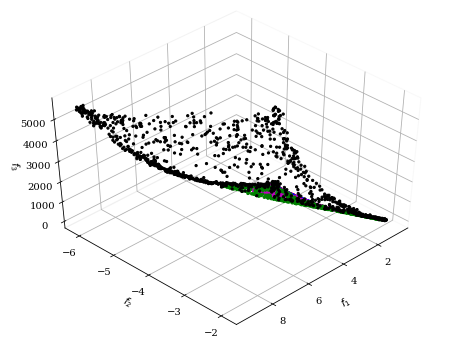

In [ ]:
plot = Scatter()
plot.add(res.F[:,[0,2,4]],  s=5, facecolors='k', edgecolors='k')
plot.add(res1.F[:,[0,2,4]], s=5, facecolors='r', edgecolors='r')
plot.add(res2.F[:,[0,2,4]], s=5, facecolors='b', edgecolors='b')
plot.add(res3.F[:,[0,2,4]], s=5, facecolors='m', edgecolors='m')
plot.add(res4.F[:,[0,2,4]], s=5, facecolors='g', edgecolors='g')
plot.show()

# Two Bar Truss Design Problem

In [ ]:
import numpy as np
from pymoo.algorithms.moo.nsga2 import NSGA2
from pymoo.core.problem import ElementwiseProblem
from pymoo.optimize import minimize
from pymoo.visualization.scatter import Scatter

class MyProblem(ElementwiseProblem):


    def __init__(self):
        super().__init__(n_var=3,
                         n_obj=3,
                         n_constr=3,
                         xl=np.array([0.00001, 0.00001, 1]),
                         xu=np.array([100, 100, 3]))

    def _evaluate(self, x, out, *args, **kwargs):

      x1 = x[0]; x2 = x[1]; x3 = x[2];

      f1 = (x1*((16 + x3**2)**0.5) + x2*((1 + x3**2)**0.5))
      f2 = (20*((16 + x3**2)**0.5)/(x3*x1))

      g1 = f1/0.1 - 1
      g2 = f2/100000 - 1
      g3 = 80*((1 + x3**2)**0.5)/(x3*x2)/100000 - 1

      f3 = max(-g1,0) + max(-g2,0) + max(-g3,0)

      out["F"] = [f1, f2, f3]
      out["G"] = [g1, g2, g3]

problem = MyProblem()

In [ ]:
import numpy as np
import math as ma
from pymoo.algorithms.moo.nsga3 import NSGA3
from pymoo.factory import get_problem, get_reference_directions
from pymoo.util.ref_dirs import get_reference_directions
from pymoo.optimize import minimize
from pymoo.visualization.scatter import Scatter
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 3, n_partitions=50)

# create the algorithm object
algorithm = NSGA3(pop_size=1350, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=200)

res = minimize(problem,
               algorithm,
               ("n_gen", 200),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |     cv_min    |     cv_avg    |      eps      |   indicator  
     1 |     1350 |      1 |  1.193803E+02 |  3.394441E+03 |             - |             -
     2 |     2700 |      1 |  1.183541E+02 |  1.744002E+03 |             - |             -
     3 |     4050 |      1 |  3.937821E+01 |  9.064215E+02 |             - |             -
     4 |     5400 |      1 |  2.010801E+01 |  4.782087E+02 |             - |             -
     5 |     6750 |      1 |  3.7330365438 |  2.451230E+02 |             - |             -
     6 |     8100 |      1 |  3.7330365438 |  1.313402E+02 |             - |             -
     7 |     9450 |      1 |  0.0932298586 |  6.822842E+01 |             - |             -
     8 |    10800 |      3 |  0.000000E+00 |  3.462827E+01 |             - |             -
     9 |    12150 |     11 |  0.000000E+00 |  1.597944E+01 |  0.1456525865 |         ideal
    10 |    13500 |     16 |  0.000000E+00 |  7.5626333105 |  0.4120551768 |         ideal

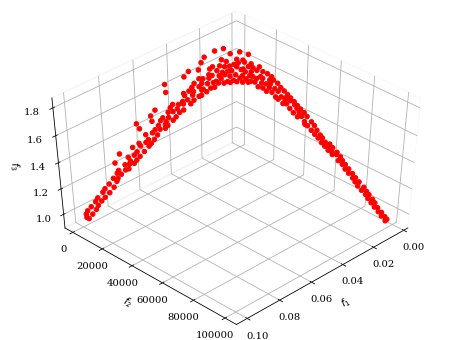

In [ ]:
plot = Scatter()
plot.add(res.F, color="red")
plot.show()

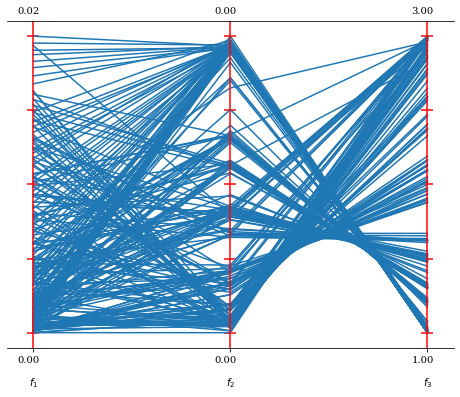

In [ ]:
from pymoo.visualization.pcp import PCP
PCP().add(res.X).show()

### **$\delta$ = [0.010, 0.025, 0.035]**

In [ ]:
def Truss_con1(x):
  return (Truss_obj1(x))/0.1 - 1

def Truss_con2(x):
  return Truss_obj2(x)/100000 - 1

def Truss_con3(x):
  return 80*((1 + x[:,2]**2)**0.5)/(x[:,2]*x[:,1])/100000 - 1

def Truss_obj1(x):
  return x[:,0]*((16 + x[:,2]**2)**0.5) + x[:,1]*((1 + x[:,2]**2)**0.5)

def Truss_obj2(x):
  return 20*((16 + x[:,2]**2)**0.5)/(x[:,2]*x[:,0])

def Truss_obj3(x):
  obj3=np.zeros(len(x))
  TC1 = Truss_con1(x); TC2 = Truss_con2(x); TC3 = Truss_con3(x);
  for i in range(0,len(x)):
    obj3[i] = obj3[i] + (max(-TC1[i],0.0) + max(-TC2[i],0.0) + max(-TC3[i],0.0))
  return obj3


In [ ]:
x = np.array([[1,1,1],[5,5,5]])
Truss_obj3(x)

array([1.99804401, 1.99978561])

In [ ]:
xe = res.X[Truss_con1(res.X)<0]; xe = xe[Truss_con2(xe)<0]; xe = xe[Truss_con3(xe)<0]
#Truss_obj2(xe)
row = np.array([1,1,1])
xe = np.append(xe, [row], axis=0)


In [ ]:
class MyProblem(ElementwiseProblem):

    def __init__(self):
        super().__init__(n_var=3,
                         n_obj=3,
                         n_constr=3,
                         xl=np.array([0.00001, 0.00001, 1]),
                         xu=np.array([100, 100, 3]))

    def _evaluate(self, x, out, *args, **kwargs):
        delta = 0.00001025
        lb = x - [delta, delta, delta]
        ub = x + [delta, delta, delta]
        sampler = qmc.LatinHypercube(d=3)
        sample = sampler.random(n=500)
        xe = qmc.scale(sample, lb, ub)
        xe = xe[Truss_con1(xe)<0]; xe = xe[Truss_con2(xe)<0]; xe = xe[Truss_con3(xe)<0];

        xe = np.append(xe, [x], axis=0)
        f1 = np.mean(Truss_obj1(xe))
        f2 = np.mean(Truss_obj2(xe))
        f3 = np.mean(Truss_obj3(xe))

        g1 = f1/0.1 - 1
        g2 = f2/100000 - 1
        g3 = 80*((1 + x[2]**2)**0.5)/(x[2]*x[1])/100000 - 1      ## This is incorrect

        out["F"] = [f1, f2, f3]
        out["G"] = [g1, g2, g3]

problem = MyProblem()

In [ ]:
# create the reference directions to be used for the optimization
ref_dirs = get_reference_directions("das-dennis", 3, n_partitions=25)

# create the algorithm object
algorithm = NSGA3(pop_size=600, ref_dirs=ref_dirs)
#algorithm = NSGA2(pop_size=200)
res2 = minimize(problem,
               algorithm,
               ("n_gen", 100),
               verbose=True,
               seed=1)

n_gen  |  n_eval  | n_nds  |     cv_min    |     cv_avg    |      eps      |   indicator  
     1 |      600 |      1 |  1.193803E+02 |  3.444665E+03 |             - |             -
     2 |     1200 |      1 |  6.796673E+01 |  1.772831E+03 |             - |             -
     3 |     1800 |      1 |  6.796673E+01 |  8.949330E+02 |             - |             -
     4 |     2400 |      1 |  1.348704E+01 |  4.563320E+02 |             - |             -
     5 |     3000 |      1 |  1.010581E+01 |  2.347797E+02 |             - |             -
     6 |     3600 |      1 |  5.5608082841 |  1.258094E+02 |             - |             -
     7 |     4200 |      1 |  0.2054075239 |  6.817289E+01 |             - |             -
     8 |     4800 |      3 |  0.000000E+00 |  3.322807E+01 |             - |             -
     9 |     5400 |      8 |  0.000000E+00 |  1.414974E+01 |  0.0868486502 |         ideal
    10 |     6000 |     25 |  0.000000E+00 |  5.8709273299 |  0.2393268146 |         ideal

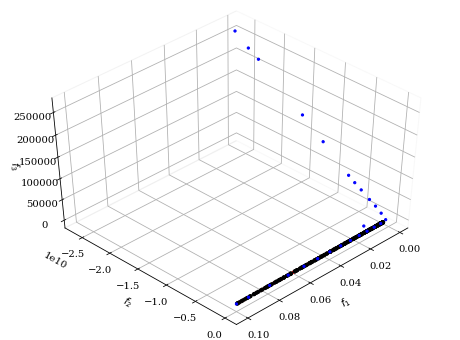

In [ ]:
plot = Scatter()
#res2.F = res2.F[res2.F[:,2]<10000]
plot.add(res.F,  s=10, facecolors='k', edgecolors='k')
plot.add(res1.F, s=5, facecolors='r', edgecolors='r')
plot.add(res2.F, s=5, facecolors='b', edgecolors='b')
#plot.add(res3.F, s=5, facecolors='m', edgecolors='m')

plot.show()

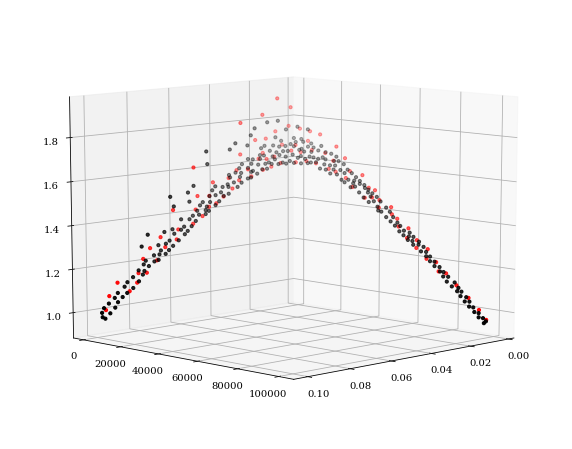

In [ ]:
from mpl_toolkits import mplot3d
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(10, 8))
ax = plt.axes(projection='3d')
ax.scatter(res.F[:,0], res.F[:,1], res.F[:,2], s=10, color="black");
ax.scatter(res1.F[:,0], res1.F[:,1], res1.F[:,2], s=10, color="red");
#ax.scatter(res2.F[:,0], res2.F[:,1], res2.F[:,2], s=10, color="blue");
ax.view_init(10, 45)